# 텍스트 분류 - 뉴스
---
- scikit-learn의 dataset인 20대 뉴스 데이터 분류

## [1] 데이터 준비
---

In [57]:
import sklearn

In [58]:
from sklearn.datasets import fetch_20newsgroups

In [59]:
newsData=fetch_20newsgroups(subset='all', remove=('headers', 'footers'))

In [60]:
newsData.keys()

dict_keys(['data', 'filenames', 'target_names', 'target', 'DESCR'])

In [61]:
print(f"data => {len(newsData['data'])}")

data => 18846


In [62]:
newsData20=newsData['data']
type(newsData20), type(newsData20[0])

(list, str)

In [63]:
print(newsData20[0])



I am sure some bashers of Pens fans are pretty confused about the lack
of any kind of posts about the recent Pens massacre of the Devils. Actually,
I am  bit puzzled too and a bit relieved. However, I am going to put an end
to non-PIttsburghers' relief with a bit of praise for the Pens. Man, they
are killing those Devils worse than I thought. Jagr just showed you why
he is much better than his regular season stats. He is also a lot
fo fun to watch in the playoffs. Bowman should let JAgr have a lot of
fun in the next couple of games since the Pens are going to beat the pulp out of Jersey anyway. I was very disappointed not to see the Islanders lose the final
regular season game.          PENS RULE!!!




In [64]:
## 타겟 데이터 확인 ----------------------------------
target=newsData['target']
type(target)

numpy.ndarray

In [65]:
print(f"target => {len(newsData['target_names'])}개")
for name in newsData['target_names']:
    print(name)
print(f'target => {target}')

target => 20개
alt.atheism
comp.graphics
comp.os.ms-windows.misc
comp.sys.ibm.pc.hardware
comp.sys.mac.hardware
comp.windows.x
misc.forsale
rec.autos
rec.motorcycles
rec.sport.baseball
rec.sport.hockey
sci.crypt
sci.electronics
sci.med
sci.space
soc.religion.christian
talk.politics.guns
talk.politics.mideast
talk.politics.misc
talk.religion.misc
target => [10  3 17 ...  3  1  7]


## [2] 데이터 전처리
---
- (1) 수집 데이터 기반 단어사전 생성
- (2) 텍스트 데이터 => 수치 데이터 변환
- (3) 데이터 길이 결정
- (4) 2진 정수화 변환

### [2-1] 단어사전 생성
---

#### [2-1-1]  불용어 처리

In [66]:
import nltk

In [67]:
# 코프스 다운로드 받기
nltk.download('stopwords', quiet=True)

True

In [68]:
# 불용어(stopword) => i my 제거
stopwords=nltk.corpus.stopwords.words('english')

In [69]:
# print(f'stopwords => {len(stopwords)}개 \n{stopwords}')

In [70]:
from tensorflow.keras.preprocessing.text import Tokenizer, text_to_word_sequence

In [71]:
for idx in range(len(newsData20)):
    news=text_to_word_sequence(newsData20[idx])
    _clear=[]
    for n in news:
        if n not in stopwords:
            _clear.append(n)
    newsData20[idx]=' '.join(_clear)

In [72]:
print(newsData20[0])

"sure bashers pens fans pretty confused lack kind posts recent pens massacre devils actually bit puzzled bit relieved however going put end non pittsburghers' relief bit praise pens man killing devils worse thought jagr showed much better regular season stats also lot fo fun watch playoffs bowman let jagr lot fun next couple games since pens going beat pulp jersey anyway disappointed see islanders lose final regular season game pens rule"

In [73]:
wtokens=set()
for news in newsData20:
    for sent in sent_tokenize(news):
        ws=word_tokenize(sent)
        for n in ws:
            if n not in stopwords:
                wtokens.add(n)

In [74]:
print(len(wtokens), wtokens)

151578 {'fall', 'electronis', 'que', 'airbus', "ck'qy", 'jockstrap', '39mie2b7n', 'rozanes', 'mcz', 'ericsc5hzr5', 'hry', 'staffing', 'aptible', '5514', '6240', 'pratchett', 'chintan', 'jas', 'xzh', '7wx', 'donny', 'a7fb', 'yh2w', 'nances', 'gengler', 'plug', 'ded', 'comparitively', 'ecara', 'spluttering', 'kuiper', 'serium', 'instdatflags', 'dmvs', 'tewrrorism', 'bush', '7777', '4wn', 'deathstroke', 'hkm', 'grants', 'ki5n', '2lk', 'jburrill', '68hc010', 'fetching', 'kathars', 'pvga1', '3ho', 'marb', 'gravis', 'c610s', 'ew27', 'fha', 'desease', '2bcf287a', 'vartan', 'wietek', '068hstg', 'onufer', '4282', 'tjohnson', 'bijective', 'imbibed', 'z1iq', 'eleanor', 'c66iqc', 'weapons', 'lpt', 'umt', 'bringin', 'x8oqvdz', '125dba', '01000000', 'tilton', 'uknet', '3ty', "'u1g", 'tidy', 'justified', '2vdtlr', 'a91', '123722', 'desegregation', 'c5t9ia', 'elang05', '4uowtl', 'xw5cgd', 'bchm', 'amx', 'dahmer', '8zs', 'lability', 'squaring', 'penelty', 'jjjjjjjjjjjjjjjjjjj', 'harb', 'labete', "'dang

In [75]:
words=set()
for news in newsData20:
    _news=word_tokenize(news)
    for n in _news:
        if n not in stopwords:
            words.add(n)

In [76]:
print(len(words), words, sep='\n')

151578
{'fall', 'electronis', 'que', 'airbus', "ck'qy", 'jockstrap', '39mie2b7n', 'rozanes', 'mcz', 'ericsc5hzr5', 'hry', 'staffing', 'aptible', '5514', '6240', 'pratchett', 'chintan', 'jas', 'xzh', '7wx', 'donny', 'a7fb', 'yh2w', 'nances', 'gengler', 'plug', 'ded', 'comparitively', 'ecara', 'spluttering', 'kuiper', 'serium', 'instdatflags', 'dmvs', 'tewrrorism', 'bush', '7777', '4wn', 'deathstroke', 'hkm', 'grants', 'ki5n', '2lk', 'jburrill', '68hc010', 'fetching', 'kathars', 'pvga1', '3ho', 'marb', 'gravis', 'c610s', 'ew27', 'fha', 'desease', '2bcf287a', 'vartan', 'wietek', '068hstg', 'onufer', '4282', 'tjohnson', 'bijective', 'imbibed', 'z1iq', 'eleanor', 'c66iqc', 'weapons', 'lpt', 'umt', 'bringin', 'x8oqvdz', '125dba', '01000000', 'tilton', 'uknet', '3ty', "'u1g", 'tidy', 'justified', '2vdtlr', 'a91', '123722', 'desegregation', 'c5t9ia', 'elang05', '4uowtl', 'xw5cgd', 'bchm', 'amx', 'dahmer', '8zs', 'lability', 'squaring', 'penelty', 'jjjjjjjjjjjjjjjjjjj', 'harb', 'labete', "'dang

In [77]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [78]:
tfVector = TfidfVectorizer()
tfVector.fit(newsData20)

TfidfVectorizer()

In [79]:
result=tfVector.transform(newsData20)
result.shape
# print(result[0])

(18846, 148237)

In [80]:
from tensorflow.keras.preprocessing.text import Tokenizer, text_to_word_sequence

#### [2-1-2] 단어사전 생성

In [81]:
myToken=Tokenizer()   # Tokenizer <- 이상한 문자들 제거 됨??

In [82]:
# 단어사전(voca) 생성
myToken.fit_on_texts(newsData20)

In [83]:
# 생성된 단어 사전 => 빈도가 높은 순
print(f'voca : {len(myToken.word_index)}개\n{myToken.word_index}')

voca : 158005개
{"'ax": 1, '1': 2, 'edu': 3, '2': 4, 'would': 5, 'one': 6, '0': 7, 'writes': 8, '3': 9, 'article': 10, 'x': 11, 'com': 12, "'": 13, 'like': 14, 'people': 15, '4': 16, 'know': 17, 'get': 18, '5': 19, 'think': 20, 'also': 21, 'q': 22, 'use': 23, 'time': 24, '7': 25, '6': 26, '8': 27, 'p': 28, "i'm": 29, 'w': 30, 'c': 31, 'could': 32, 'well': 33, 'good': 34, 'may': 35, 'r': 36, 'even': 37, 'new': 38, 'g': 39, 'see': 40, 'e': 41, 'max': 42, 'us': 43, 'way': 44, 'much': 45, 'two': 46, 'first': 47, 'many': 48, 'make': 49, '9': 50, 'right': 51, 'b': 52, 'say': 53, 'god': 54, 'system': 55, 'n': 56, 'want': 57, 'anyone': 58, 'used': 59, 'u': 60, 'said': 61, 'v': 62, 'need': 63, 'really': 64, 'something': 65, 'go': 66, 'since': 67, 'problem': 68, 'work': 69, '10': 70, 'z': 71, 'believe': 72, 'back': 73, 'h': 74, 'still': 75, 'please': 76, "i've": 77, 'going': 78, 'file': 79, 'k': 80, 'l': 81, 'find': 82, 'using': 83, 'windows': 84, 'point': 85, 'take': 86, 'year': 87, 'last': 88, 

In [105]:
print(newsData20[0])

sure bashers pens fans pretty confused lack kind posts recent pens massacre devils actually bit puzzled bit relieved however going put end non pittsburghers' relief bit praise pens man killing devils worse thought jagr showed much better regular season stats also lot fo fun watch playoffs bowman let jagr lot fun next couple games since pens going beat pulp jersey anyway disappointed see islanders lose final regular season game pens rule


In [87]:
# 생성된 단어 개수
print(f'word_counts : {myToken.word_counts}')

word_counts : OrderedDict([('sure', 2572), ('bashers', 15), ('pens', 204), ('fans', 415), ('pretty', 1193), ('confused', 159), ('lack', 444), ('kind', 1395), ('posts', 413), ('recent', 478), ('massacre', 194), ('devils', 183), ('actually', 1992), ('bit', 2456), ('puzzled', 17), ('relieved', 15), ('however', 2252), ('going', 3067), ('put', 2021), ('end', 1733), ('non', 1626), ("pittsburghers'", 1), ('relief', 122), ('praise', 56), ('man', 1549), ('killing', 397), ('worse', 454), ('thought', 1530), ('jagr', 84), ('showed', 279), ('much', 4680), ('better', 2751), ('regular', 423), ('season', 802), ('stats', 262), ('also', 7000), ('lot', 1964), ('fo', 45), ('fun', 295), ('watch', 457), ('playoffs', 245), ('bowman', 54), ('let', 1708), ('next', 1530), ('couple', 900), ('games', 1219), ('since', 3385), ('beat', 278), ('pulp', 6), ('jersey', 129), ('anyway', 968), ('disappointed', 46), ('see', 4916), ('islanders', 169), ('lose', 297), ('final', 506), ('game', 2061), ('rule', 458), ('brother',

In [88]:
# myToken.filters

In [104]:
# 단어사전의 사용빈도 높은 것을 기준으로 단어사전 크기 제한
type(myToken.word_index.keys())
for key in myToken.word_index.keys():
    print(f'{key} : {myToken.word_counts[key]}')

'ax : 61907
1 : 18847
edu : 16602
2 : 14678
would : 14231
one : 13599
0 : 13493
writes : 13316
3 : 12751
article : 11381
x : 10765
com : 9246
' : 9122
like : 8992
people : 8770
4 : 8213
know : 8105
get : 7813
5 : 7808
think : 7134
also : 7000
q : 6628
use : 6413
time : 6304
7 : 6287
6 : 5916
8 : 5749
p : 5696
i'm : 5665
w : 5653
c : 5619
could : 5589
well : 5431
good : 5241
may : 5193
r : 5165
even : 5155
new : 5153
g : 4951
see : 4916
e : 4894
max : 4789
us : 4744
way : 4682
much : 4680
two : 4672
first : 4587
many : 4556
make : 4542
9 : 4541
right : 4252
b : 4222
say : 4193
god : 4108
system : 4104
n : 4065
want : 3975
anyone : 3939
used : 3885
u : 3857
said : 3798
v : 3640
need : 3522
really : 3430
something : 3429
go : 3407
since : 3385
problem : 3349
work : 3299
10 : 3287
z : 3221
believe : 3200
back : 3198
h : 3148
still : 3142
please : 3101
i've : 3101
going : 3067
file : 3020
k : 3009
l : 3004
find : 2965
using : 2956
windows : 2945
point : 2933
take : 2889
year : 2883
last : 2

people's : 179
tough : 179
nist : 179
december : 179
answered : 179
survey : 179
astronomy : 179
newsletter : 179
austin : 179
july : 178
empire : 178
kingdom : 178
judgement : 178
chain : 178
seat : 178
slower : 178
1993apr23 : 178
mid : 178
wins : 178
routines : 178
sins : 178
justify : 178
height : 178
candida : 178
holes : 178
magnus : 178
anymore : 177
rock : 177
helmet : 177
fourth : 177
reverse : 177
athena : 177
indicate : 177
union : 177
reached : 177
manufacturers : 177
stock : 177
adobe : 177
practical : 176
motor : 176
handling : 176
solutions : 176
records : 176
azerbaijani : 176
battle : 176
storage : 176
destroy : 176
fee : 176
diamond : 175
testing : 175
fred : 175
accident : 175
cornell : 175
who's : 175
favor : 175
technologies : 175
convinced : 175
millions : 175
mirror : 175
ee : 175
conversation : 175
characters : 175
coach : 175
lebanon : 175
lucky : 175
kuwait : 175
bush : 175
unknown : 174
believes : 174
taught : 174
components : 174
global : 174
victims : 174
s

lh : 81
2j : 81
mb8f : 81
stretch : 80
afternoon : 80
doctrines : 80
contacts : 80
standings : 80
offering : 80
950 : 80
concepts : 80
maintenance : 80
hughes : 80
oxford : 80
walter : 80
sr : 80
enemies : 80
hung : 80
subsequent : 80
sequences : 80
fresh : 80
cleansing : 80
210 : 80
electricity : 80
compress : 80
forgotten : 80
confidence : 80
nope : 80
wishes : 80
altitude : 80
1979 : 80
pipe : 80
reduction : 80
concluded : 80
leg : 80
turk : 80
controllers : 80
forcing : 80
priests : 80
ink : 80
traditions : 80
regime : 80
absolutes : 80
layout : 80
mach : 80
architecture : 80
measured : 80
picking : 80
gp : 80
drops : 80
estimated : 80
handler : 80
passes : 80
bills : 80
osf : 80
v4 : 80
obo : 80
graphical : 80
labs : 79
edited : 79
spoken : 79
peaceful : 79
preserve : 79
v8 : 79
render : 79
judgment : 79
suggesting : 79
butt : 79
believer : 79
negotiations : 79
formation : 79
stress : 79
brains : 79
requiring : 79
dsl : 79
demands : 79
borland : 79
resulted : 79
harris : 79
1975 :

holder : 47
behold : 47
gf : 47
defects : 47
marriages : 47
promising : 47
charging : 47
mpc : 47
chess : 47
margin : 47
compartment : 47
expo : 47
fulfill : 47
dole : 47
firms : 47
glutamate : 47
existent : 47
montana : 47
calculated : 47
filtering : 47
openlook : 47
heavens : 47
seeds : 47
saddam : 47
plains : 47
mpr : 47
hart : 47
tongues : 47
asteroids : 47
3m : 47
162 : 47
sparcstation : 47
ussr : 47
electron : 47
hg : 47
boyle : 47
brute : 47
symbolic : 47
questionable : 47
6x : 47
meets : 47
abroad : 47
abraham : 47
tongue : 47
hextall : 47
zd : 47
uo : 47
7v : 47
3q : 47
157 : 47
pbmplus : 47
spd : 47
118 : 47
qd : 47
q5o : 47
dietary : 47
smokeless : 47
disappointed : 46
regional : 46
steady : 46
restored : 46
beware : 46
studio : 46
smoothly : 46
mullen : 46
coffey : 46
carpenter : 46
167 : 46
148 : 46
313 : 46
speeding : 46
ego : 46
andre : 46
shafer : 46
luxury : 46
waving : 46
mild : 46
cn : 46
founding : 46
incarnation : 46
khan : 46
1993apr30 : 46
levine : 46
accepts : 4

demos : 29
sinless : 29
spike : 29
brass : 29
impedance : 29
vicious : 29
childish : 29
kinsey's : 29
ceased : 29
211 : 29
t47 : 29
x5w : 29
zs : 29
6d : 29
vz : 29
'2 : 29
u9 : 29
vx : 29
nhs : 29
soviets : 29
tia : 29
applelink : 29
woman's : 29
j2 : 29
subsequently : 29
spiderman : 29
tolerate : 29
pexlib : 29
arg : 29
yount : 29
puckett : 29
5x : 29
244 : 29
251 : 29
grandfather : 29
iifx : 29
krillean : 29
commercials : 29
symmetric : 29
erickson : 29
discounts : 29
eo : 29
avs : 29
incompetent : 29
9f9f : 29
a' : 29
q2 : 29
75di : 29
730 : 29
hispanic : 29
z3 : 29
erzincan : 29
utkvx : 29
announcers : 29
g8 : 29
1n : 29
echl : 29
sura : 29
t8 : 29
q8 : 29
g2 : 29
toad : 29
525 : 29
gaa : 29
trophy : 29
bauer : 29
360k : 29
pizza : 28
invoked : 28
overdrive : 28
loudly : 28
nicholls : 28
292 : 28
425 : 28
603 : 28
515 : 28
snark : 28
capitalism : 28
maven : 28
electromagnetic : 28
susan : 28
lexus : 28
completion : 28
citing : 28
cns : 28
supplement : 28
mayor : 28
colin : 28
blai

tainted : 20
yah : 20
rabbit : 20
bimacs : 20
casbah : 20
contractor : 20
individual's : 20
ruff : 20
prestige : 20
mantle : 20
theatre : 20
30th : 20
confirms : 20
milan : 20
scandal : 20
fs7 : 20
pill : 20
northlands : 20
medications : 20
ashes : 20
granting : 20
filtered : 20
invention : 20
artifacts : 20
emission : 20
algorythm : 20
risked : 20
cradle : 20
livermore : 20
advertisements : 20
loyalty : 20
yields : 20
tones : 20
accidently : 20
levi : 20
rtp : 20
anna : 20
mikael : 20
vinfo : 20
p00261 : 20
lust : 20
rests : 20
tach : 20
xview3 : 20
brainwashed : 20
phony : 20
hal9k : 20
sideways : 20
dwarf : 20
privilege : 20
thx : 20
she'll : 20
refs : 20
underdog : 20
bassen : 20
yawney : 20
removes : 20
exports : 20
deviant : 20
bites : 20
unborn : 20
avi : 20
negligent : 20
cain : 20
whine : 20
stretches : 20
synonymous : 20
unicorns : 20
lvc : 20
893 : 20
patterson : 20
agnostics : 20
yitzhak : 20
quicken : 20
bates : 20
capita : 20
660 : 20
314 : 20
dominion : 20
bisexual : 20


keithley : 15
stortek : 15
aldus : 15
uow : 15
pctools : 15
317 : 15
comprise : 15
discriminatory : 15
achievement : 15
repeater : 15
glance : 15
whosoever : 15
indefinitely : 15
prolonged : 15
shining : 15
soe : 15
interception : 15
icomsim : 15
db7n : 15
falsely : 15
explaination : 15
pumps : 15
humidity : 15
2010 : 15
jihad : 15
dam : 15
nyt : 15
invokes : 15
pauline : 15
discoveries : 15
979 : 15
ambush : 15
unprotected : 15
brandon : 15
1993apr7 : 15
strobe : 15
multilateral : 15
readiness : 15
bilateral : 15
watnxt08 : 15
kojian : 15
crook : 15
muratoff : 15
crane : 15
bir : 15
birinci : 15
babiali : 15
defterleri : 15
dahiliye : 15
1929 : 15
imparatorlugu'nun : 15
devleti : 15
harbi : 15
tarihi : 15
whughes : 15
ths : 15
startled : 15
featuring : 15
robb : 15
1945 : 15
pond : 15
privileged : 15
prodrive : 15
monty : 15
penn : 15
escaping : 15
skewed : 15
amonte : 15
zalapski : 15
outta : 15
hyundai : 15
apocrypha : 15
superceded : 15
prowess : 15
lonnie : 15
excitable : 15
pcl :

aspirin : 12
concentrating : 12
blh : 12
babble : 12
hmo : 12
'til : 12
superhuman : 12
moshe : 12
utrecht : 12
drs : 12
jovian : 12
wedlock : 12
ordinances : 12
4fg : 12
anonymously : 12
riddle : 12
jap : 12
radicals : 12
anecdote : 12
ummm : 12
godless : 12
hossien : 12
fiat : 12
polk : 12
haapanen : 12
inn : 12
recurrent : 12
93112 : 12
egalon : 12
perturbations : 12
nsi : 12
brit : 12
slime : 12
bulgarian : 12
729 : 12
fpcc : 12
808 : 12
1430 : 12
winfield's : 12
297 : 12
hyped : 12
rum : 12
instrumentation : 12
aiken : 12
blashephemers : 12
arches : 12
pulldown : 12
energies : 12
einstein's : 12
tribute : 12
gimme : 12
deported : 12
georgian : 12
environs : 12
derives : 12
1304 : 12
832x624 : 12
scribes : 12
regulating : 12
nasda : 12
deplibs : 12
centipedes : 12
dissertation : 12
immigration : 12
proportionately : 12
nicosia : 12
renaming : 12
grep : 12
srg : 12
toppoint : 12
csd4 : 12
champ : 12
expeditions : 12
vos : 12
aerodynamics : 12
potholes : 12
goodyear : 12
vuw : 12
gui

assigning : 9
cassettes : 9
mikes : 9
next02cville : 9
stilgar : 9
proliferation : 9
safeguard : 9
aspin : 9
csce : 9
intermittently : 9
unplugging : 9
mongols : 9
unsympathetic : 9
atrocious : 9
shines : 9
cardiac : 9
sardarapat : 9
rebirth : 9
kadar : 9
vukela : 9
mazbatalari : 9
levant : 9
mezalim : 9
terakki : 9
beal : 9
curricula : 9
fascinated : 9
schwarzenegger : 9
regal : 9
marquette : 9
300k : 9
enviroment : 9
1993mar30 : 9
gals : 9
parodies : 9
benny : 9
confirming : 9
cpa : 9
viamar : 9
nicknames : 9
lectorium : 9
mins : 9
cunneyworth : 9
janssens : 9
gosselin : 9
breathed : 9
sdcn : 9
reversible : 9
herm : 9
magus : 9
tibetans : 9
occupiers : 9
pacifism : 9
conacher : 9
gullibility : 9
groping : 9
sherlock : 9
unusually : 9
idolaters : 9
daydream : 9
unavoidable : 9
olaf : 9
narrowed : 9
appeasement : 9
confiscate : 9
signetics : 9
991 : 9
copier : 9
1564 : 9
dissent : 9
motel : 9
evangelists : 9
trickier : 9
samaritan : 9
underlined : 9
microcom : 9
ldo : 9
disagreements :

repetition : 8
middlesex : 8
pdbourke : 8
omicron : 8
datafiles : 8
screendump : 8
visualizer : 8
963 : 8
aviris : 8
pcw : 8
scian : 8
xmol : 8
dcl : 8
wartime : 8
fzr : 8
2800 : 8
skndiv : 8
slogans : 8
mathews : 8
5mhz : 8
techs : 8
mandell : 8
abnormalities : 8
sincerity : 8
attn : 8
sprang : 8
perimeter : 8
excretion : 8
cleverly : 8
scien : 8
havn't : 8
wink : 8
stung : 8
columnists : 8
maureen : 8
summoned : 8
delt : 8
reassure : 8
conserveative : 8
month's : 8
driveways : 8
ribbons : 8
fsk : 8
tem : 8
jcpl : 8
ohayon : 8
execs : 8
lumped : 8
redundant : 8
fasting : 8
disobedient : 8
bride : 8
thirteenth : 8
ferguson : 8
654 : 8
pcf : 8
sbi : 8
r4c : 8
o0i : 8
lc4u : 8
v9f : 8
45' : 8
m1z4 : 8
fj8 : 8
bnkj : 8
mf9f9 : 8
9hl : 8
'hz : 8
9f9f9f9f9 : 8
a04 : 8
fql556t4 : 8
mma : 8
ptm : 8
nxy : 8
6ub0d : 8
ggb : 8
e1t : 8
m9p : 8
mr8f : 8
ameline : 8
testimonies : 8
1886 : 8
basra : 8
refrained : 8
pasha : 8
flourishing : 8
fleets : 8
splat : 8
289 : 8
pmafire : 8
inel : 8
ominous :

6526 : 7
duplicates : 7
schroeder : 7
icebucket : 7
bunkers : 7
mwr : 7
eleventh : 7
caucus : 7
vetoed : 7
hanse : 7
averaging : 7
refractive : 7
labeling : 7
markc : 7
hr1025 : 7
demolition : 7
665 : 7
bday : 7
sufficent : 7
ssss : 7
jarkko : 7
detroit's : 7
obprediction : 7
microscopes : 7
banished : 7
josef : 7
backdrop : 7
kuala : 7
lumpur : 7
imprecise : 7
14228 : 7
pancreas : 7
asc : 7
fluffy : 7
wrapper : 7
optimist : 7
z80 : 7
greenfield : 7
disqualified : 7
birmingham : 7
factiod : 7
artificially : 7
gfxbase : 7
atk : 7
pike : 7
thereabouts : 7
1250 : 7
dolezal : 7
saber : 7
professionalism : 7
shrewd : 7
grandiose : 7
ryevm : 7
ryerson : 7
broadcasters : 7
mgl : 7
svc : 7
minimise : 7
thorny : 7
reconnaissance : 7
insecurity : 7
andreychuck : 7
ikkoku : 7
cherry's : 7
rebounds : 7
paints : 7
herds : 7
centering : 7
enh : 7
bonn : 7
intensities : 7
plunge : 7
voyage : 7
tichauer : 7
ss24x : 7
environmentally : 7
tuesday's : 7
deterministic : 7
oceans : 7
postulated : 7
st3283a

hunch : 6
chara : 6
venerean : 6
meteorite : 6
sakigake : 6
comet's : 6
belmont : 6
earths : 6
matza : 6
easteee : 6
sieve : 6
punk : 6
leidenuniv : 6
wimp : 6
24bits : 6
etherlink : 6
120k : 6
calipers : 6
adorn : 6
souvlaki : 6
verne : 6
decayed : 6
caligula : 6
amun : 6
3443 : 6
addons : 6
stiehm : 6
setscsi : 6
corelscsi : 6
ling : 6
realiability : 6
scofield : 6
aldridge : 6
astonishingly : 6
bacitracin : 6
apache : 6
errey's : 6
interfaced : 6
c64 : 6
downgrade : 6
ei4 : 6
om4u : 6
r8e : 6
mbs0tq : 6
bs0tq6 : 6
9f9f9f9f : 6
nrk : 6
2de14 : 6
z6e : 6
1eqtct : 6
morgoth : 6
nagasiva : 6
shortcut : 6
sighting : 6
fords : 6
append : 6
congestion : 6
estrogen : 6
nutr : 6
sewell : 6
mothra : 6
unfairly : 6
invents : 6
mccurdy : 6
f7a : 6
backdraft : 6
sizing : 6
lancer : 6
gizmos : 6
ovule : 6
macliesh : 6
predecessor : 6
wycliffe : 6
lubricants : 6
hao : 6
thumpers : 6
ostia : 6
csli : 6
rotag : 6
mao : 6
popovic : 6
keijo : 6
aslin : 6
varvio : 6
koivu : 6
overriding : 6
baptizing :

snell : 5
houdini's : 5
1205 : 5
1186 : 5
1184 : 5
1177 : 5
1075 : 5
plp : 5
1061 : 5
garryola : 5
campi : 5
zachmans : 5
1034 : 5
mules : 5
kanada : 5
leaguen : 5
follies : 5
ojala : 5
976 : 5
fuzzfaces : 5
1068 : 5
1065 : 5
bob's : 5
1048 : 5
1043 : 5
darse : 5
929 : 5
frack : 5
turkeys : 5
931 : 5
920 : 5
sandy's : 5
roadrunners : 5
spawn : 5
itars : 5
elective : 5
choicers : 5
holster : 5
woken : 5
committment : 5
mosfet : 5
cgfour : 5
acollins : 5
ornl : 5
spx : 5
disapproves : 5
parenthetical : 5
reactionary : 5
explainations : 5
loisc : 5
delve : 5
safty : 5
fibreglass : 5
paladin : 5
342 : 5
deathstroke : 5
costume : 5
crchh7a9 : 5
hectares : 5
puppy : 5
wilken : 5
windscreen : 5
2k7 : 5
formidable : 5
recital : 5
bane : 5
activating : 5
excellently : 5
maternal : 5
sportswriters : 5
dgj2y : 5
jacobowitz : 5
ycc : 5
quirk : 5
krypton : 5
lipid : 5
ulf's : 5
safties : 5
snatched : 5
michae : 5
dumber : 5
noun : 5
indispensable : 5
wreckage : 5
fasten : 5
jessea : 5
u013 : 5
nine

parroted : 4
oehler : 4
yar : 4
percival : 4
peel : 4
g5a : 4
suchlike : 4
befuddled : 4
mcelwre : 4
c5ut1s : 4
3xa : 4
otherwords : 4
pitty : 4
ileum : 4
prostanoid : 4
infanticide : 4
superficially : 4
soya : 4
steaks : 4
curtain : 4
adpeters : 4
sunflower : 4
introduces : 4
croaker : 4
steaming : 4
im4u : 4
2365 : 4
sysinfo : 4
contoller : 4
dgw : 4
hatfield : 4
rung : 4
testamony : 4
xmpushbuttonwidgetclass : 4
atd : 4
1v6 : 4
1r5rnn : 4
rdt : 4
bu008 : 4
shanti : 4
calvinists : 4
foreknew : 4
incurs : 4
kellogg : 4
commence : 4
reexamine : 4
excavating : 4
dwelt : 4
biomath : 4
gutierrez : 4
gaskets : 4
flocking : 4
saratoga : 4
pacing : 4
100452 : 4
16793 : 4
rawlin : 4
wathcing : 4
firsteps : 4
cautionary : 4
36s : 4
wfw2 : 4
dubinski : 4
strnlghtc5pucl : 4
6kp : 4
bios's : 4
thibedeau : 4
monitering : 4
apprieciated : 4
kids' : 4
terminal's : 4
'kill : 4
fortold : 4
dov : 4
msi : 4
27322 : 4
offical : 4
saturday's : 4
surfacing : 4
damning : 4
i'ld : 4
granada : 4
15440 : 4
c5n

j3f : 4
iol : 4
oli : 4
edi : 4
11k : 4
jtk : 4
9bj : 4
v8s : 4
mcg : 4
u1s : 4
vj8 : 4
m52 : 4
m4w : 4
m'0 : 4
baz : 4
aow : 4
u43 : 4
l39 : 4
xeg : 4
tud : 4
cg8 : 4
mqa : 4
fts : 4
ej6 : 4
l78 : 4
destrade : 4
barberie : 4
xdrawpoint : 4
addr1 : 4
addr2 : 4
uuinfo : 4
xchar : 4
gmtime : 4
nyour : 4
tioccc : 4
flag's : 4
tfile : 4
fstat : 4
fileno : 4
isspace : 4
fscanf : 4
usernames : 4
isalnum : 4
ninvalid : 4
nauthor : 4
nline : 4
ninfo : 4
tnext : 4
3bsd : 4
0x3f : 4
bzero : 4
cated : 4
cating : 4
cates : 4
llat : 4
obfuscare : 4
fuscare : 4
fuscus : 4
obfuscatory : 4
subtleties : 4
monsarrat : 4
jgm : 4
lacova : 4
6257 : 4
swin : 4
magna : 4
castrated : 4
castration : 4
tripling : 4
aright : 4
anchorage : 4
inky's : 4
eclipses : 4
footer : 4
directory's : 4
formulations : 4
preeminent : 4
salamis : 4
ns16550afn : 4
availble : 4
metrodome : 4
dwallach : 4
iubvm : 4
vtvm1 : 4
tronic : 4
twiddler : 4
hume : 4
baton : 4
rouge : 4
scottsdale : 4
pods : 4
tilts : 4
rearrange : 4
pedal

drugstore : 4
diederic : 4
diederich : 4
kbos : 4
lasergames : 4
nec's : 4
xoring : 4
lobbies : 4
rxd : 4
copists : 4
28074 : 4
tact : 4
llyene : 4
dsav : 4
rainout : 4
hcbc5un9l : 4
hcb : 4
mistracks : 4
polymer : 4
stomping : 4
amit : 4
clinch : 4
telefinder : 4
i'at : 4
valdez : 4
rumanian : 4
moldavia : 4
larissa : 4
3570 : 4
listmember : 4
clergyman : 4
sniffer : 4
undefiled : 4
joe's : 4
disseminating : 4
rose's : 4
irreconcilable : 4
abingdon : 4
ahithophel : 4
pupming : 4
crazoids : 4
rootless : 4
bureaucracies : 4
guillen : 4
735251839 : 4
000rpm : 4
horsemen : 4
wonderfull : 4
refurbished : 4
refurbish : 4
permissions : 4
rightwing : 4
missle : 4
macportable : 4
salaris : 4
10176 : 4
tasalloti : 4
aricel : 4
wiles : 4
tali : 4
nietzche : 4
bowyer : 4
drawplot : 4
gaskins : 4
whitewashed : 4
fox's : 4
plainfield : 4
mcvay : 4
unprofessional : 4
weimar : 4
2915 : 4
trapdoor : 4
scintific : 4
hcs : 4
scientology : 4
strawberry's : 4
logon : 4
neuroscience : 4
pricier : 4
steuer 

nitrate : 3
he3 : 3
3rds : 3
dakes : 3
539 : 3
003749 : 3
15710 : 3
220252 : 3
14731 : 3
beauties : 3
14313 : 3
wednesdays : 3
vigils : 3
goof : 3
1r1cl7innknk : 3
tendancies : 3
disillusion : 3
'marriage' : 3
'banging' : 3
asocial : 3
beahavior : 3
suggeeded : 3
order' : 3
incorportates : 3
cmrr : 3
ls8139 : 3
runing : 3
unscholarly : 3
sophmoric : 3
backlog : 3
totalling : 3
4mx9 : 3
navigating : 3
microworld : 3
bionet : 3
junkie : 3
topone : 3
theapp : 3
xmnheight : 3
xmnwidth : 3
setitup : 3
dik : 3
meleedy : 3
stressful : 3
1347 : 3
02146 : 3
xconsole : 3
xcutsel : 3
xditview : 3
xfd : 3
88mb : 3
dep : 3
oleo : 3
p30 : 3
facinated : 3
citicorp : 3
lipner : 3
deteriorated : 3
c697ij : 3
iua : 3
7589 : 3
iguana : 3
exorbitant : 3
silliest : 3
practicle : 3
dissected : 3
dweeb : 3
3comm : 3
csr : 3
targas : 3
c5hq3o : 3
loo : 3
27yr : 3
ruby : 3
loot : 3
gomer : 3
8400 : 3
lmcdapi : 3
predatory : 3
suisse : 3
fd's : 3
'boss' : 3
eagles' : 3
9nt : 3
smucs1 : 3
cosell : 3
redskins : 3

sherry : 3
diferent : 3
lulu : 3
favoritism : 3
4pt : 3
maccvm : 3
'standard' : 3
5inch : 3
tvf : 3
inkjets : 3
jaggies : 3
221331 : 3
26203 : 3
navo : 3
4636 : 3
wrongo : 3
fif : 3
telecommuting : 3
dicussion : 3
cals : 3
ivr : 3
epimntl : 3
95901 : 3
70611 : 3
westmoreland : 3
6984 : 3
depicts : 3
center's : 3
differnt : 3
windowsnt : 3
222600 : 3
11690 : 3
k35 : 3
helms : 3
iskut : 3
24945 : 3
neutralizing : 3
pelliccio : 3
kd1nr : 3
thhhppptt : 3
retardent : 3
wlieftin : 3
wouter : 3
mitchum : 3
separations : 3
'armeniya' : 3
haiastan : 3
khoren : 3
assyrians : 3
complexion : 3
mrl : 3
dsto : 3
corporation's : 3
emptive : 3
gchin : 3
budejovice : 3
jyp : 3
jokp : 3
kalpa : 3
735660736snz : 3
13892 : 3
28880 : 3
goop : 3
polocies : 3
kurvers : 3
gusarov : 3
kypreos : 3
lidster : 3
dimaio : 3
loach : 3
mcbain : 3
beukeboom : 3
mccrimmon : 3
ewen : 3
snuggerud : 3
moller : 3
houlder : 3
zettler : 3
lafreniere : 3
osiecki : 3
hervey : 3
picard : 3
cummins : 3
otevrel : 3
semchuk : 3
ch

151818 : 3
sadden : 3
berk : 3
salad : 3
supermarkets : 3
hallo : 3
1r8pcn : 3
finely : 3
culpepper : 3
fculpepp : 3
orselak : 3
torborg : 3
ibb : 3
chatting : 3
dmcgee : 3
uluhe : 3
personalize : 3
p1124 : 3
180456 : 3
17573 : 3
133319 : 3
7008 : 3
adder : 3
resistent : 3
robichaux : 3
nti : 3
233742 : 3
26839 : 3
heightened : 3
economicly : 3
reorganization : 3
155002jsn104 : 3
turabi : 3
object's : 3
consumer's : 3
kyler : 3
chlorination : 3
toffee : 3
gp2f : 3
735489679 : 3
grabrail : 3
prefereably : 3
ns16550af : 3
libbers : 3
cizeta : 3
1r0fpv : 3
georgec : 3
muse : 3
'another : 3
screwdrivers : 3
cowering : 3
dreitman : 3
c4tshu : 3
ew6 : 3
incapacitate : 3
admonition : 3
gobble : 3
sterilization : 3
sculpture : 3
fruitcakes : 3
waaaay : 3
entreaty : 3
reinforcing : 3
bowie : 3
korresh : 3
'government : 3
'crisis' : 3
pea : 3
1qvb5ainnmoi : 3
lemme : 3
discusions : 3
nastiness : 3
17mb : 3
056 : 3
094 : 3
tournaments : 3
2fvpmantel : 3
haloween : 3
intravai : 3
oakbrook : 3
flhs

gerrold : 3
orthanc : 3
mengel : 3
67m : 3
mackie's : 3
rankings : 3
falcons : 3
morel : 3
icehawks : 3
springall : 3
rgs7077 : 3
gasser : 3
csrag : 3
machnik : 3
nin15b34 : 3
nagano : 3
fairgrounds : 3
stat's : 3
dimaggio's : 3
zinsser's : 3
dimorphism : 3
microbiologist : 3
bolden : 3
14226 : 3
7251 : 3
overheating : 3
'white' : 3
speaketh : 3
v7vga : 3
ni5010 : 3
5210 : 3
wd80003e : 3
8514a : 3
xtreme : 3
9985 : 3
92121 : 3
6030 : 3
03060 : 3
9051 : 3
sdarling : 3
wpine : 3
whitepine : 3
fon : 3
faceoffs : 3
60th : 3
matin : 3
rosh : 3
amerks : 3
170330 : 3
12314 : 3
fcsc : 3
ns16550 : 3
mct : 3
otl : 3
berger : 3
larin : 3
06108 : 3
daisies : 3
p00168 : 3
mahoney : 3
ioerger : 3
aguilera : 3
visuallib : 3
dpl : 3
micor : 3
user'' : 3
nnnn' : 3
declassify : 3
sjg : 3
laquey : 3
abetting : 3
turbulence : 3
ethane : 3
triton's : 3
charon's : 3
flibble : 3
glop : 3
groink : 3
lackluster : 3
halabi : 3
mevicore : 3
clientmessage : 3
xchangeproperty : 3
oblongbuttonwidgetclass : 3
xsky :

garagiola : 2
fluence : 2
zabolotzky : 2
ericsc4x1k9 : 2
apz : 2
rambos : 2
montana's : 2
steinfeldt : 2
tinkers : 2
evers : 2
limestone : 2
lopsided : 2
deselect : 2
galei : 2
mehola : 2
haemek : 2
multiplicity : 2
att's : 2
shoehorned : 2
k3d : 2
27378 : 2
manute : 2
bol : 2
stagnant : 2
encryp : 2
203456 : 2
9605 : 2
121501 : 2
jlieb : 2
liebelson : 2
alta : 2
93apr18005752 : 2
flippant : 2
compellingly : 2
almalga : 2
mation : 2
otherworldly : 2
plawaby : 2
probie : 2
060607 : 2
12380 : 2
choreography : 2
9426 : 2
spca : 2
161357 : 2
20354 : 2
4263 : 2
sparcstaton : 2
4581 : 2
dilemmas : 2
vanbeisbrouck : 2
gump : 2
worsley : 2
read's : 2
fl1 : 2
ebv : 2
anthropologists : 2
backgroun : 2
anser : 2
singe : 2
programmatic : 2
skunk : 2
kranz : 2
accommodated : 2
tipset : 2
nissen : 2
repinski : 2
gare : 2
kanske : 2
tippa : 2
slutspelet : 2
ser : 2
mellan : 2
llet : 2
samma : 2
inom : 2
hur : 2
ster : 2
djurg : 2
rden : 2
svenska : 2
huddinge : 2
ven : 2
boden : 2
spurn : 2
negates :

fgr : 2
vyn : 2
fyn2 : 2
pgtl : 2
k4u : 2
jznkj : 2
1nd : 2
hx5 : 2
0ex : 2
x5q : 2
5hl : 2
l4jy : 2
dx59 : 2
ng2z : 2
bl2 : 2
iqrpu : 2
vr7 : 2
p5e : 2
3e99lp : 2
wu46 : 2
flg : 2
lyjs1j : 2
m3zvm : 2
5o4 : 2
rlb8 : 2
njh : 2
mqir : 2
h0j : 2
4wc : 2
h0i : 2
k7o : 2
nya : 2
h8y : 2
q64 : 2
oq1 : 2
iidkmqhl : 2
mnew : 2
mqjw : 2
g4yj : 2
kjzpeu : 2
pwu4 : 2
'x3 : 2
mlkhf : 2
ajznajz : 2
ve0 : 2
fyj : 2
mmqjm : 2
m34r : 2
8pl : 2
16wmq6m : 2
txa : 2
145k7 : 2
141sk : 2
wmqir : 2
16hj : 2
16m3 : 2
m'q : 2
5k14 : 2
kjznkh : 2
94s : 2
s8z : 2
yn2 : 2
f6d : 2
cnl2 : 2
w81 : 2
1ez'a : 2
16wk : 2
jvwm : 2
3zur : 2
rnahf : 2
air3w : 2
ajzlg : 2
jko : 2
fah : 2
rmp : 2
rmzu : 2
ou4 : 2
145k145 : 2
mmzur : 2
m'q6m : 2
5ki : 2
b9rmw : 2
041452 : 2
27262 : 2
hyun : 2
maher : 2
yitzak : 2
shiploads : 2
teleological : 2
protoevangelium : 2
c5ldi2 : 2
enolan : 2
sharkbite : 2
misuses : 2
'joke' : 2
racet : 2
tosoh : 2
ec003b : 2
slinking : 2
nomex : 2
paraphenalia : 2
healthcare : 2
eastgate : 2
onio

lmsc5 : 2
bene : 2
images' : 2
'anonymous' : 2
'ftp' : 2
confusions : 2
dialo : 2
gue : 2
squalid : 2
sation : 2
qadian : 2
mirza : 2
ghulam : 2
judiasm : 2
hin : 2
tablished : 2
c5v15a : 2
davka : 2
maslov : 2
mindedly : 2
intentioned : 2
overvoltage : 2
francise : 2
darkly : 2
freight : 2
extraneously : 2
'astrology' : 2
'sci' : 2
goldstein : 2
rdg : 2
disintegrated : 2
65mph : 2
skillful : 2
tpo : 2
lp52 : 2
mk156f : 2
emulex : 2
drm : 2
wuit : 2
yaska : 2
sankar : 2
kamensky's : 2
'sprite' : 2
cartriges : 2
stymied : 2
icky : 2
restroom : 2
anybodys : 2
moniterm : 2
reconditioning : 2
recentley : 2
sucessfuly : 2
3zh : 2
devadatta : 2
mukutmoni : 2
nehru : 2
accusors : 2
symbolisms : 2
1ff : 2
revising : 2
frontally : 2
wads : 2
031349 : 2
21824 : 2
c6z32r : 2
ah9 : 2
complacent : 2
novelists : 2
prohibitionist : 2
133626 : 2
7425 : 2
9x15 : 2
9x15b : 2
5001x431 : 2
tweeked : 2
loretta : 2
postgraduate : 2
specializing : 2
holyoke : 2
harvard's : 2
st01 : 2
asymptomatically : 2
tco

6f9 : 2
baker's : 2
generalizes : 2
c5jgc4 : 2
ajj : 2
raged : 2
jbreed : 2
effector : 2
bulldozer : 2
900km : 2
xcb : 2
xprimary : 2
nibbles : 2
chewed : 2
abrahamic : 2
044140 : 2
u92 : 2
hwong : 2
cleanser : 2
069 : 2
hundley : 2
161838 : 2
13213 : 2
felixg : 2
gallo : 2
implimenting : 2
timedrive : 2
victoriaõs : 2
eyc : 2
programer : 2
smokless : 2
armories : 2
steadfastly : 2
paraboloid : 2
ecologist : 2
biologist : 2
1qn627 : 2
spooky : 2
ezrahut : 2
'shaped : 2
peace' : 2
truthfullness : 2
'cast : 2
israel' : 2
depresses : 2
mendoza : 2
mgolden : 2
000mi : 2
17megs : 2
pmq : 2
aquarid : 2
telstar : 2
usmp : 2
45acp : 2
wjhovi01 : 2
hovingh : 2
quean : 2
lutibelle : 2
025027 : 2
4846 : 2
electical : 2
arutunian : 2
'are : 2
lendrush : 2
soils : 2
semashko : 2
heartbreak : 2
overcrowding : 2
livable : 2
delicately : 2
mince : 2
nervously : 2
supervises : 2
secrete : 2
aneurysms : 2
peels : 2
chewable : 2
600mg : 2
brightly : 2
malaysian : 2
swanky : 2
chinses : 2
scallop : 2
1pim

parminder : 2
bhandari : 2
messengership : 2
stubbornness : 2
usmi01 : 2
213024 : 2
140493201843 : 2
x27 : 2
usefullness : 2
depleting : 2
pkzip's : 2
1qmcih : 2
i84 : 2
vender : 2
sansui : 2
akai : 2
hagins : 2
sbradley : 2
ofk : 2
lve00wb2avukto : 2
concoctions : 2
nostrums : 2
c5s9zm : 2
9e0 : 2
sunscreen : 2
towerl : 2
veggie : 2
hotdogs : 2
8473 : 2
deans : 2
chelvadae : 2
inexperience : 2
sarsats : 2
sarsat : 2
emergencies : 2
cg3c : 2
tabarraci : 2
larter : 2
sheared : 2
darkening : 2
hp28sx : 2
grievous : 2
regulates : 2
quantums : 2
shoa : 2
goerbels : 2
governement : 2
dissagrees : 2
critizises : 2
appreciates : 2
jpolito : 2
sysgem1 : 2
disreputable : 2
1r74a4 : 2
h2t : 2
oscilators : 2
fierro : 2
dampen : 2
jelson : 2
rcnext : 2
lewisville : 2
3556 : 2
4656 : 2
padi : 2
54909 : 2
graphicalness : 2
gwtj : 2
saught : 2
clc : 2
ipu : 2
oscilliscopes : 2
sturm : 2
prioritize : 2
skopje : 2
mycolor : 2
topwin : 2
4lm : 2
groundballs : 2
bate : 2
jingoistic : 2
extents : 2
hither

256x9 : 2
populous : 2
displacements : 2
scarcer : 2
offloaded : 2
paycheque : 2
naifs : 2
tehy : 2
cockroft : 2
backfired : 2
pharos : 2
pyramids : 2
interconnectedness : 2
81000000 : 2
19500 : 2
mbl : 2
plopped : 2
sunos41 : 2
kurt's : 2
044 : 2
amb4 : 2
ceee : 2
pgplot : 2
tjp : 2
lab2 : 2
dmitriev : 2
posta : 2
fiok : 2
1753696 : 2
2017760 : 2
multiplot : 2
xln : 2
agb16 : 2
mbuc : 2
subgrid : 2
subtic : 2
subviews : 2
subtractions : 2
tougaard : 2
sciplot3 : 2
wesemann : 2
scillerstr : 2
fiasko : 2
supermongo : 2
re00 : 2
vt100s : 2
paintjet : 2
manip : 2
columnar : 2
fitls : 2
pentcheff : 2
dean2 : 2
macintoshs : 2
compatables : 2
thermography : 2
satie : 2
aipd : 2
dilating : 2
gtfs : 2
2455 : 2
100c : 2
95494 : 2
franceus : 2
paledit : 2
devonshire : 2
8925 : 2
nonfpu : 2
photomac : 2
locke : 2
01752 : 2
photopress : 2
3039 : 2
marigold : 2
91360 : 2
9973 : 2
pict2 : 2
perceptics : 2
pellissippi : 2
37933 : 2
9200 : 2
ate1 : 2
01852 : 2
rtrue : 2
toucheds : 2
rpaints : 2
rpaste

subw : 2
majesty's : 2
erupts : 2
1833 : 2
uninhabitable : 2
dislodged : 2
entrances : 2
weinberger : 2
mendez : 2
converging : 2
pym : 2
antiwar : 2
nonproliferation : 2
breck : 2
14822 : 2
'lame' : 2
202305 : 2
toddi : 2
5878 : 2
falke : 2
circulates : 2
embarass : 2
e24 : 2
pericentre : 2
c5ngxq : 2
uxbridge : 2
packards : 2
revb : 2
filmpak : 2
ewoo : 2
emile : 2
earth' : 2
thedatafile : 2
dirdatafile : 2
deems : 2
pat87 : 2
bih91 : 2
bi91a : 2
bri86 : 2
bro89 : 2
bro90 : 2
cam93 : 2
eve83 : 2
goldreich : 2
kam78 : 2
kin78 : 2
kinnucan : 2
lai90 : 2
lub88 : 2
rackoff : 2
luby : 2
psuedorandom : 2
siam : 2
me91a : 2
mey78 : 2
nbs77 : 2
she88 : 2
sor84 : 2
book'' : 2
20755 : 2
ftpbk : 2
ftpdf : 2
ftpey : 2
ftpmr : 2
ftppk : 2
ftpso : 2
1423 : 2
jitter : 2
signifcant : 2
antecdent : 2
mx17s : 2
2881 : 2
northrup : 2
degel : 2
hatorah : 2
soliman : 2
erev : 2
shavuot : 2
krakowskie : 2
przedmies'cie : 2
nauk : 2
spol : 2
c5d05g : 2
6xw : 2
155819 : 2
18237 : 2
instigator : 2
yok : 2
pl

klasko : 1
c5rbht : 1
pastortalk : 1
startext : 1
mc344578 : 1
rel65 : 1
ironies : 1
hightower : 1
407602 : 1
keirnan : 1
737257015 : 1
bashkirs : 1
owieneramus : 1
cemal : 1
kutay : 1
harbord : 1
kazim : 1
shuraghel : 1
akpazar : 1
zarshad : 1
childir : 1
indemnities : 1
msprague : 1
mcwbst311b : 1
tristate : 1
w4w2 : 1
'hockey : 1
lessons' : 1
girdles : 1
13960 : 1
sxs : 1
extol : 1
sridhar : 1
iconed : 1
deiconified : 1
ssridhar : 1
contient : 1
glockenspeil : 1
dialog1 : 1
2710 : 1
132906 : 1
nfld : 1
feely : 1
demagoguery : 1
muti : 1
housebreak : 1
housetrained : 1
huskey : 1
8843 : 1
protext : 1
typical' : 1
cold' : 1
o'connor's : 1
'dog's : 1
'zavalli : 1
kole' : 1
'cairo : 1
garegin : 1
kelbadzhar : 1
easytrax : 1
044248 : 1
16010 : 1
headstart : 1
2h30 : 1
'pull' : 1
weanted : 1
getprofilestring : 1
10xlog : 1
199304160443 : 1
aa25231 : 1
requestors : 1
duelling : 1
224250 : 1
19772 : 1
macweek's : 1
hp730 : 1
kph2q : 1
neurosurgical : 1
donnybrook : 1
artsy : 1
fartsy : 1
os

v912182 : 1
wicat : 1
villumsen : 1
ovillumsen : 1
wantosch : 1
sasowa : 1
fahr : 1
apwhite : 1
brianw : 1
umd5 : 1
crispy : 1
wyble : 1
schunix : 1
rwyble : 1
zabbal : 1
jzawodn : 1
735709605 : 1
paukstis : 1
iterations : 1
noplace : 1
ykk's : 1
ykk : 1
globetrotters : 1
dieon : 1
touchdowns : 1
biblcal : 1
apocolic : 1
boneheadedly : 1
132320icjps : 1
icjps : 1
tridom : 1
ngolding : 1
golding : 1
053516 : 1
28846 : 1
steczkowski : 1
intertestimental : 1
apsevokoitai : 1
acess : 1
faus : 1
halsey : 1
redford : 1
193739 : 1
13359 : 1
152706 : 1
27518 : 1
girfriend : 1
campfire : 1
cheper : 1
eggshell : 1
eventful : 1
soggy : 1
whoom : 1
elminated : 1
haldeman : 1
busse : 1
cofounders : 1
counselees : 1
segragation : 1
contibution : 1
33point : 1
735586800 : 1
thar's : 1
doomsville : 1
devellano's : 1
1r1eu1 : 1
1qhu7s : 1
d3u : 1
9apr199312315727 : 1
firman : 1
93apr9115458 : 1
conficts : 1
confict : 1
184959 : 1
9451 : 1
invisibile : 1
jasen : 1
mabus : 1
hman : 1
mabusj : 1
'straight

plos4loqxl : 1
xey4b : 1
m99nsfb4 : 1
n7zg : 1
8rlimri : 1
6rlh : 1
w466w3q : 1
9st3qsecs8 : 1
2jy : 1
ud36 : 1
ac5iqveiq : 1
qvg'qy : 1
fdorfdzd4 : 1
fge : 1
okh8 : 1
2dil : 1
d3j1ab : 1
'qvg'oy'' : 1
puqrr : 1
89iq : 1
zqvdzd6g'd2 : 1
aff106dz : 1
3iid2 : 1
oafdz : 1
hzalj1 : 1
khfnevznb8fpkjz728f : 1
hfnkjzngvz7 : 1
z77t : 1
m'bpl77ut : 1
4l72q : 1
l77utpbq : 1
vznbs : 1
hzhvp : 1
6rpu : 1
2pu'l : 1
p98xk : 1
oa5e9 : 1
oj3q : 1
b'tu'gv : 1
'ayt'bqt735 : 1
'tl77tu : 1
fxey4 : 1
mgzg : 1
mrfw80 : 1
8rcs : 1
rju : 1
2jy7 : 1
b1or : 1
iqs5id6f : 1
6dzd88z : 1
1rkwh : 1
'ff : 1
z3qw : 1
p0l : 1
c9l : 1
oqy''qs61q : 1
ios61q : 1
1afdzah9i : 1
cj108 : 1
feid9 : 1
id6f1d9 : 1
cj1d9 : 1
c8d4 : 1
zpkjznkhf : 1
ng2zpeutngvznevz'k : 1
m72q : 1
pgvz72q : 1
5ut'bq : 1
xl77u : 1
5tu77u : 1
5tu72q : 1
pgut : 1
7vz77tl : 1
'1tpazz : 1
axgiyu : 1
2vz0 : 1
v61p : 1
4aq9 : 1
sa5epp8x : 1
7tu72q : 1
pl'etl75u : 1
mgzv : 1
w1t44 : 1
w3qw13s1t3s : 1
13rj : 1
pg4 : 1
31b : 1
jpt745 : 1
4745'u : 1
qshz : 1


mgy3 : 1
slqfbq : 1
gqjqj : 1
fi2 : 1
'2tm : 1
gizigg : 1
45umuge : 1
2t56ql2di : 1
236r : 1
2d2fax : 1
3o'9vo : 1
co'628 : 1
61jf : 1
jdkmrvmk : 1
pmf9f9f9f9f9l0q : 1
e82l : 1
5q1ug : 1
2m34u : 1
36r : 1
n1jjnb : 1
g99 : 1
81xj3a : 1
5q0x : 1
rm04 : 1
6ql1 : 1
2hw4u : 1
jjj'ax : 1
m5555 : 1
masf5' : 1
slax : 1
tvbud : 1
qfbq : 1
fh'65e2 : 1
9f9f3v9 : 1
pmf9f8 : 1
gg5 : 1
rnt4 : 1
'aqph4 : 1
fyld : 1
ldfyn : 1
3ev' : 1
d9jh : 1
i14 : 1
slqfah : 1
2dl : 1
mkfn : 1
nxy679v : 1
0f' : 1
a'9vo : 1
gg445u : 1
7hem : 1
t2z : 1
hpum8gw : 1
1e941 : 1
nxy65 : 1
nhvj : 1
02r4e : 1
o5khz : 1
iajlz2di : 1
dkhc : 1
2tcv9f9f9f9d : 1
9f3w2tct : 1
2sw : 1
2tn086 : 1
812gg445u : 1
okya8 : 1
0dfyl : 1
fmeif5eidw : 1
m4egn : 1
2divbtm9 : 1
mqfbql : 1
o4t2 : 1
fjslvjdkhb : 1
n8bj1n : 1
''83 : 1
dj'ax : 1
24h12 : 1
4p'5u : 1
7ha1l : 1
ob4e : 1
3du55 : 1
l556t4 : 1
qkfj : 1
xggx : 1
966fidu : 1
xgnyu : 1
slycc : 1
fjdkhb : 1
cdy61p : 1
ud1v6xv : 1
a8783 : 1
mgh1xgg4x : 1
75vql : 1
fjjjjj : 1
jla7 : 1
rm2' : 

0y4 : 1
b'4r : 1
42rl5 : 1
q6w'q5r : 1
l77tl : 1
4cql2yh : 1
e94 : 1
rlyy1 : 1
ffz : 1
nkjrpgvz : 1
kjz772z82411h : 1
141skwe : 1
5il : 1
7tl'kjz'l : 1
2vm : 1
kfb : 1
fyidkhahl : 1
rk1 : 1
r'w : 1
wmq6m : 1
mlkjzlki : 1
uqs4uorpu : 1
plqrpl : 1
7'qrr : 1
7tl75tl : 1
payt : 1
lpetl : 1
5tlnbp : 1
2rznkjzng0f729tngtf : 1
71k : 1
nairlkjzlb : 1
5o'v : 1
145k15o : 1
15ok15o : 1
k145mq45k16m : 1
15ok0 : 1
z02vzj : 1
bjj : 1
7vz77u : 1
4yk9 : 1
z0y4b : 1
6q6m0 : 1
mrw : 1
ajznb : 1
m75ut7 : 1
84cql : 1
b'3oq2 : 1
a965dk : 1
rony4 : 1
965i16 : 1
w89 : 1
5hr7h : 1
fyjlkh : 1
mlajw : 1
z77u : 1
tlg1 : 1
plnetl : 1
'0lnbq : 1
pgutpl : 1
ngut75w : 1
hlnbq : 1
ng0l : 1
rz'ki : 1
neutnkjznki : 1
znb9r : 1
ahfnahf : 1
bmmzvwmzvm : 1
5'q45k16m : 1
k145 : 1
16mmw : 1
mmq6wk16m : 1
12vz0 : 1
jm6bq0qu : 1
7u45965j : 1
l0qh : 1
sdj : 1
bna : 1
qbs : 1
884cql : 1
d2n'8 : 1
b'3nl : 1
165e9 : 1
mq45 : 1
mzvmd : 1
phfnajz7 : 1
hfnai : 1
3o'8 : 1
qefyjlkh : 1
1ir : 1
nb8f75vznetfnkk : 1
b8f75u : 1
lkjr75t : 

m4j42l : 1
i1zi4mu6i3 : 1
j51g4krwxe4 : 1
mgf79lrad : 1
u2ku : 1
5csu5j3zi4ov : 1
2b6 : 1
vjfu3u : 1
ige : 1
ejty : 1
fr9vk : 1
v6j : 1
gggli4he : 1
sk4 : 1
m4s : 1
3z8zntru : 1
9yejzs9lf0jrddr : 1
uiv : 1
y5e0 : 1
u30 : 1
ox5 : 1
xav : 1
y2qn : 1
q56s : 1
hdil : 1
c4om : 1
rp4jhkz : 1
fnx : 1
jmf : 1
i'u : 1
ykwgdm : 1
x93m : 1
52eutwr : 1
qyp' : 1
f1y : 1
a61mbkxyjw : 1
2inzb : 1
vj1 : 1
lzgv : 1
vr56 : 1
27sk8b23 : 1
xdh141 : 1
bq0tk : 1
meo14 : 1
qg4p'72 : 1
i3p9 : 1
zvu2 : 1
6yl : 1
krm307jj4t : 1
75mji : 1
vtjv6e3x95m : 1
jel4 : 1
pvzqp : 1
2havr : 1
hlbv : 1
ltwd : 1
83x5f : 1
t1e4 : 1
115p : 1
tdu3p5d : 1
h'd2g : 1
63x6 : 1
e0sg : 1
6os5 : 1
x6e : 1
5'q' : 1
vaws : 1
bjdj : 1
py7 : 1
zit : 1
xzh : 1
i44 : 1
wh6t : 1
bn6top : 1
m4r' : 1
0jh : 1
j93 : 1
lddvt7d : 1
vc64s : 1
0jx5gvp : 1
2wc : 1
mlkph166 : 1
5qt : 1
j9s : 1
85t21m : 1
amdp : 1
mk3n : 1
p1kdzj8i : 1
qeg : 1
t2mogtl : 1
khqsvy : 1
osj : 1
9zd : 1
p5j6 : 1
yfrw9 : 1
8i' : 1
hskb : 1
m9ejfj6yev : 1
y9kez : 1
be5 : 1
5

helmetted : 1
nogin : 1
immoveabe : 1
immoveable : 1
relible : 1
mosters : 1
215826 : 1
undby : 1
gasline : 1
preservative : 1
c5xx27 : 1
g32 : 1
dendritic : 1
adventually : 1
29198 : 1
161531 : 1
11737 : 1
bimbo : 1
remar : 1
sutton's : 1
trouped : 1
salesman's : 1
drown : 1
franciscoidle : 1
dangerfield : 1
mabee : 1
hellhole : 1
boobs : 1
flamboyance : 1
immmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmm : 1
hmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmm : 1
jacob' : 1
cephas : 1
pitied : 1
bartmich : 1
8039 : 1
pocatello : 1
092913 : 1
18724 : 1
d'ippolito : 1
artefacts : 1
gersham : 1
meharg : 1
hypos : 1
fy92 : 1
relaively : 1
deisgn : 1
detatch : 1
142356 : 1
c5rlps : 1
jhallen : 1
1qvk8sinn9vo : 1
pricelist : 1
m2322k : 1
b03b : 1
4745 : 1
b002a : 1
frag : 1
forground : 1
cur : 1
sor : 1
cursorcolor : 1
27468 : 1
portrayal : 1
hegesippus' : 1
skulking : 1
clemetine : 1
'interpretations : 1
imparting : 1
220100 : 1
17867 : 1
pratical : 1
biggist : 1
whils

mxxkc : 1
bhhrbn : 1
rxxi : 1
bdy8bhi : 1
wm86 : 1
gbea8 : 1
ty83o : 1
a83n : 1
ty83n : 1
scua83o : 1
'qsiid9 : 1
sj1rliid3iirlhz : 1
mc8rlk : 1
k803hzrcisv : 1
fumrck8 : 1
6umrlhz : 1
3hzrfw : 1
hz03imv : 1
lk8rb : 1
orlj1v : 1
mrlk8rlhzrlk : 1
8rlhz : 1
shzv' : 1
mas04 : 1
asrmam : 1
5st44 : 1
w1w4711 : 1
sqww : 1
ww85w287 : 1
xtgcxte : 1
xwoc2 : 1
wlrx : 1
rxwm : 1
xwlr3hi : 1
m3hhr : 1
hryxi86 : 1
zrlho : 1
d'8v : 1
mrftov : 1
zrcimrck : 1
rck8rg : 1
06umv : 1
k8rd'8 : 1
lhzrlho0 : 1
rchzd3k : 1
zrchzd3hormb1v : 1
limrlk8 : 1
mc8v' : 1
mrmc80 : 1
13r613p : 1
s1145s1 : 1
6ed5st : 1
cxwocxwoc : 1
hkcxs : 1
rxxj : 1
xtxrbhhrbn : 1
i8bdy : 1
3hhrbhhr6 : 1
csyt : 1
ty8ct : 1
yucsyx : 1
mcucs6 : 1
cua83ecs6 : 1
6f1ab : 1
id88z : 1
chod4' : 1
mrlhzd : 1
shzrlhzv : 1
orlho : 1
1rlhzri : 1
mrmamrb : 1
zrmc804'8 : 1
k8rck8 : 1
amrd : 1
tzrmc8 : 1
6emasri : 1
8ri8 : 1
meft : 1
mt3qs : 1
ecs11 : 1
wa85w0' : 1
cxwocbhkcx : 1
rbdy8 : 1
8bhj : 1
83dxr6 : 1
ksbdz : 1
id6eiab : 1
6eiqvdzd3k' : 1
6d

vick : 1
trickiest : 1
froever : 1
'alway : 1
warn' : 1
'healthier' : 1
19apr199310484591 : 1
juggernauts : 1
10056 : 1
9069 : 1
conscign : 1
malefactor : 1
reliegions : 1
paradisal : 1
pilaged : 1
16101 : 1
561923 : 1
564934 : 1
hra : 1
underfunded : 1
dwyer : 1
breadbox : 1
chlorophyll : 1
resiliency : 1
tain't : 1
backgroundcolor : 1
foregroundcolor : 1
rmehta : 1
crunchy : 1
whizzo : 1
c4rz4j : 1
4q9 : 1
040606 : 1
c6c5za : 1
watserv2 : 1
1pp991 : 1
t63 : 1
040819 : 1
14943 : 1
chould : 1
brightnesses : 1
'or' : 1
30303 : 1
0451 : 1
siegert : 1
tanghe : 1
michele : 1
guyton : 1
poshedly : 1
stauter : 1
stuckey : 1
authors' : 1
union's : 1
tyuratam : 1
veneras' : 1
unobtainable : 1
redesig : 1
nated : 1
1521 : 1
southernly : 1
radiotechnology : 1
blamont : 1
skyward : 1
firsts : 1
suisei : 1
ducma : 1
soviets' : 1
permeated : 1
necessitated : 1
enshrouded : 1
bobbed : 1
layer's : 1
rusalka : 1
mermaid : 1
reactivate : 1
milligram : 1
discrepan : 1
cies : 1
turbulent : 1
downdraft : 

8480 : 1
kimba : 1
liddelow : 1
libgcc2 : 1
'unknown : 1
yahooooooooo : 1
yahooooooooooo : 1
crier : 1
1rhnb4 : 1
1pp : 1
enlite : 1
art'' : 1
stereoscope : 1
0943 : 1
0729 : 1
coachhouse : 1
28909 : 1
gvg47 : 1
preciousness : 1
735153129 : 1
100170 : 1
aftervendorcf : 1
ziedman : 1
nhlpa' : 1
algirithm : 1
siggraph'92 : 1
costomer : 1
plough : 1
furrow : 1
5115 : 1
beachcomber : 1
93035 : 1
l'm : 1
734063606 : 1
neophytos : 1
detracting : 1
unloved : 1
westernizers : 1
faradshev : 1
karabakh's : 1
123404 : 1
18191 : 1
personell : 1
oughtta : 1
130234 : 1
23728 : 1
hollowpoints : 1
gatakeeper : 1
averag : 1
instumental : 1
paintball : 1
68ii : 1
squeegie : 1
buttplate : 1
sportview : 1
zborowsk : 1
testicle : 1
necrophiliac : 1
231654 : 1
14060 : 1
defrauded : 1
incosistent : 1
hardness : 1
warreth : 1
entangleth : 1
unequally : 1
shouldest : 1
jehoshaphat : 1
sttod : 1
'kosmos' : 1
eph6 : 1
1q7615innmi : 1
thining : 1
alogrithm : 1
theodosios : 1
pavlidis : 1
181701 : 1
27425 : 1
arta

eg4 : 1
p0y : 1
ga1r : 1
9oi7 : 1
lumx : 1
uf52 : 1
srx : 1
s8p : 1
dp1na : 1
28m : 1
cuvq4uognp : 1
fayj6k : 1
8mp : 1
i4y : 1
cup9i : 1
j'b : 1
u3bxcm : 1
bns3zb : 1
o7yt3 : 1
xf7 : 1
38t : 1
umcd8 : 1
'l3en : 1
585f : 1
ef'y : 1
h'3 : 1
lvzwlt5sd5j : 1
0v2 : 1
v0hs : 1
z41'p : 1
8ug'cd : 1
i55 : 1
kcl : 1
t1eltzhp : 1
n4si6t : 1
b4'p : 1
mof : 1
x6p : 1
p9g'w : 1
ahpdl' : 1
ezc : 1
wums : 1
ul8j : 1
598n : 1
y3t : 1
rr6x : 1
mz8kh : 1
xcm : 1
czxn'w : 1
s4t : 1
'ax6k : 1
isurl : 1
n'e2 : 1
uov : 1
opo : 1
'iua : 1
pn8 : 1
scyt8gs : 1
lv7 : 1
g8t7tf : 1
ag4c : 1
oq0 : 1
mcv : 1
jrogk' : 1
00q : 1
8ory : 1
vngx : 1
pfn'a : 1
ro' : 1
lw3 : 1
ya3 : 1
lpib : 1
8tpr : 1
uxy : 1
3zd1 : 1
ybn : 1
4p7vyknmr3b : 1
n0qz : 1
lufy : 1
9vgt : 1
s1u : 1
y9ai : 1
4km : 1
pa7d : 1
yml : 1
zkiv : 1
mnxrx : 1
b1s : 1
8oa : 1
mpm9pv : 1
iiq : 1
xego0xm : 1
l7a' : 1
hhva : 1
5eur2 : 1
1iiixl : 1
7aa : 1
c2k : 1
x9fef : 1
s3ot : 1
s8r : 1
dm5 : 1
3lkxez : 1
demmxq : 1
y78f : 1
s240pj : 1
g'on : 1
ebvy : 

94583 : 1
7khz : 1
116hz : 1
735172473 : 1
'create : 1
sandcastles : 1
egyptologist : 1
enourmously : 1
negroid : 1
subcontinent : 1
nassar : 1
sadat : 1
racist's : 1
undercurrent : 1
dicotomy : 1
magnums : 1
gunstore : 1
xnote : 1
hydrophones : 1
durious : 1
heatshrink : 1
claro : 1
optisolator : 1
1657 : 1
cd4066 : 1
jfet : 1
risetime : 1
043242 : 1
ecountered : 1
disoriened : 1
antihypertensive : 1
mind's : 1
deshais : 1
gag's : 1
graze : 1
'scar : 1
tissue' : 1
bortels : 1
3227 : 1
technotes : 1
49555 : 1
n9a : 1
6z7 : 1
carnforth : 1
9es : 1
1652 : 1
manzini : 1
pmb : 1
greenhills : 1
1502 : 1
compte : 1
barnhouse : 1
foulest : 1
cofidence : 1
chastening : 1
timonty : 1
awakens : 1
misspent : 1
tast : 1
hyprocrite : 1
velieve : 1
detours : 1
heavely : 1
joshua1 : 1
lysator : 1
tits : 1
hygienic : 1
bumble : 1
polyn : 1
optimisations : 1
waaay : 1
9887 : 1
u9245669 : 1
referi : 1
carnation : 1
cabbalistic : 1
hurnard : 1
folkert : 1
boonstra : 1
c5j5mi : 1
75082 : 1
privs : 1
plus'

simearth : 1
dragonball : 1
pc12 : 1
pheochromocytoma : 1
sv40 : 1
bovine : 1
1slb46 : 1
lbu : 1
mserv1 : 1
coulter : 1
daresbury : 1
nancyo : 1
masm : 1
tp6 : 1
2bac23ff : 1
25215 : 1
120365 : 1
105805 : 1
0x8 : 1
entranced : 1
zeroed : 1
hqs : 1
peddled : 1
truk : 1
inpenatrable : 1
ulimatum : 1
nuremburg : 1
defendent's : 1
pervading : 1
tamoor : 1
zaidi : 1
bernardino : 1
achievment : 1
impeded : 1
creted : 1
'pristine' : 1
yesteryear : 1
wetsern : 1
modernity : 1
anyboby : 1
194316 : 1
25522 : 1
circumventricular : 1
adeno : 1
neurohypophysis : 1
cannon's : 1
lgibb : 1
dosshell : 1
windo : 1
supersport : 1
recharger : 1
9234 : 1
badtothebone : 1
geekys : 1
geekies : 1
geekae : 1
geekii : 1
blighty : 1
734890344 : 1
93apr9160836 : 1
cslab1g : 1
sparrowfart : 1
121624 : 1
oozes : 1
dredges : 1
tzedukkah : 1
caricaturing : 1
ingratitude : 1
marly : 1
kimgh : 1
chupp : 1
greenspun : 1
manouvering : 1
philip's : 1
225127 : 1
25062 : 1
aplies : 1
genocidist : 1
suddam : 1
'common : 1
co

hopcroft : 1
kernighan : 1
ritchie : 1
obfusc : 1
hamiltonian : 1
grobner : 1
svax : 1
lipschitz : 1
novavax : 1
zine : 1
westport : 1
02790 : 1
c5riwa : 1
2or : 1
8968 : 1
1rsvgr : 1
r13 : 1
polit : 1
admiralty : 1
disavowed : 1
1040's : 1
yawanga : 1
200619 : 1
5371 : 1
1r0mb9 : 1
lapm : 1
usr's : 1
bimodem : 1
fast'' : 1
unlockfolder : 1
lepa : 1
8755 : 1
'approved' : 1
disolving : 1
complicitous : 1
175022 : 1
15543 : 1
malecki : 1
dramalecki : 1
023508 : 1
11556 : 1
koko : 1
altair : 1
upping : 1
grossed : 1
facile : 1
toplas : 1
outstripping : 1
remainded : 1
uist : 1
bundling : 1
sigois : 1
galls : 1
8414 : 1
5686 : 1
97068 : 1
ranching : 1
unprobable : 1
rationals : 1
kubota's : 1
xs24z : 1
inoppurtune : 1
stz : 1
powerball : 1
amass : 1
stampeded : 1
armoring : 1
nitric : 1
unlikly : 1
1pqarb : 1
crucej : 1
osshe : 1
cruce : 1
retoracle : 1
vx800 : 1
briar : 1
0284 : 1
t500 : 1
734553308snx : 1
curveballs : 1
144859 : 1
mc8b : 1
pomeranian : 1
vaccinate : 1
backpacked : 1
ellu

m7zc3 : 1
bgwwfdc : 1
9i1 : 1
'tl0t : 1
3i9w3yvdjx : 1
ckam2 : 1
uzmpd : 1
7qj9 : 1
sfhl8q : 1
qsox : 1
tjo2 : 1
wvt : 1
gp'igxp17 : 1
naxtiq5 : 1
kzazdr2 : 1
fl2 : 1
3hromxpva : 1
wp120 : 1
acxx : 1
ug5 : 1
'fy : 1
pdy : 1
7nk : 1
gv3g : 1
o9o : 1
h6w : 1
m7x : 1
izf0 : 1
wcgw : 1
q85ns : 1
8'y : 1
zfs0 : 1
dq6 : 1
x'6o : 1
cd0n1gq5 : 1
d20 : 1
nhyfn2d : 1
bu04 : 1
00lb : 1
xq0gxi : 1
1oa : 1
xskzxk : 1
psmfh : 1
yx7xc'8vy : 1
en9 : 1
e7djx : 1
c'p1qs : 1
oh4 : 1
7gz : 1
4fq : 1
zsqc : 1
o57b4 : 1
y7d : 1
e64sk : 1
3ba7 : 1
d'n6w : 1
a0sl : 1
zabpp : 1
qg0 : 1
'qkm6 : 1
0ev8 : 1
wree : 1
j3x'9pul : 1
dmrw : 1
5l3n : 1
ofwg : 1
a01e : 1
mmbp : 1
u9zq : 1
hze : 1
vxr8 : 1
15hlsh : 1
i3yyw : 1
5bd : 1
m16s : 1
g3x : 1
lju : 1
yun : 1
3z8 : 1
xqeo1t : 1
nky : 1
ovs : 1
0uy : 1
''s : 1
yk1zu3 : 1
1b82 : 1
h0r : 1
3'a3e : 1
ayl : 1
fpmm2 : 1
xm8sr : 1
e45 : 1
5i20 : 1
z6d : 1
cp4 : 1
nhrag : 1
m5v703k : 1
tqhb0 : 1
h8tdx : 1
lqc6nt : 1
38k'e8 : 1
klbp : 1
fcc7t : 1
s8c : 1
re' : 1
90lc : 1


74xhj : 1
yug : 1
okzzokzyr : 1
f965e965e : 1
eih : 1
btie : 1
75upvyn : 1
2f8c : 1
2tms : 1
zjjjh : 1
6t1 : 1
74kt : 1
x0k826'ax : 1
skzznkjznk : 1
mjznkzzl3 : 1
fj'ax : 1
dle86'0t : 1
mr'5u : 1
6q046p4 : 1
2figizij : 1
12b5u : 1
v5e965e : 1
g5ugg : 1
4h124 : 1
gmhm : 1
rq6k'lk : 1
c46eko : 1
1dhj : 1
e2v5 : 1
5e975u : 1
kr'ax : 1
i4'n : 1
891b : 1
odb : 1
n2tle : 1
25a86'0 : 1
an2w5u : 1
slqk'o6ei : 1
ol1tm : 1
gizij : 1
'dy : 1
e966 : 1
o'q : 1
6awq9 : 1
gql : 1
pw45 : 1
'qv : 1
g9hs9khl : 1
hfmkjjjj : 1
fij9e965u : 1
75q3 : 1
okzp : 1
v5e98 : 1
24e86'0 : 1
2tk : 1
o6ejq6gy : 1
l1vl9 : 1
tmvf : 1
mjjidheo : 1
'5ugiz : 1
vbud : 1
vo2 : 1
l4hh : 1
75uv : 1
d'695260 : 1
g91jjjjjjj : 1
mib4xp : 1
5e965e : 1
m965e965p : 1
965e1 : 1
gxb2v1dfmk : 1
hql8 : 1
pmvbf : 1
fij0 : 1
fij8epp : 1
e94eg9 : 1
5l4he : 1
okjznkz : 1
j2tm : 1
jji : 1
25a825 : 1
81xj75u : 1
m55555 : 1
e965e1 : 1
k'lk : 1
pha1 : 1
2tpc : 1
hpvmhmi : 1
1dp : 1
o0v3 : 1
chs9n : 1
fyn2vx : 1
54i59 : 1
emks : 1
psgix : 1
1e96

kusbs6 : 1
minibus : 1
skirmish : 1
xkeybind : 1
malmute : 1
applientology : 1
locator : 1
ntnixterm : 1
tftpd : 1
'lo : 1
1r7fp6innsua : 1
microsort : 1
winsx : 1
gd6420 : 1
updgrading : 1
20350 : 1
windowws : 1
10718 : 1
winbench's : 1
performance' : 1
fasthelp : 1
mstools : 1
'mstools' : 1
setpower : 1
iconised : 1
'negative' : 1
addpath : 1
prepends : 1
containg : 1
'upgraded' : 1
efforst : 1
jaya : 1
000710 : 1
27408 : 1
1r22coinnhg1 : 1
bladerunner : 1
pecota's : 1
etronics : 1
tcpstart : 1
tcpstop : 1
735516045 : 1
xttranslatecoordinates : 1
jrpayne : 1
c5x3e6 : 1
cell's : 1
173742 : 1
99726 : 1
hl00 : 1
microfine : 1
attendace : 1
cabriolet : 1
suberb : 1
gentium : 1
ketchup : 1
pickles : 1
condiments : 1
wfl : 1
legenary : 1
26848 : 1
286's : 1
n3foa : 1
370mhz : 1
expiring : 1
sacremento : 1
121823 : 1
21851 : 1
dawidowicz : 1
nadir : 1
hitlerology : 1
hilter : 1
aquiesced : 1
originaly : 1
reneged : 1
emotiaonal : 1
extreemly : 1
govenrment : 1
beleives : 1
dukes : 1
imensel

iqcvagubk8ajrxzxn : 1
vroblfaqfsbwp : 1
mhepy4g7ge8mo5wpsivx : 1
khyyxmerfao : 1
7ltvtmvtu66nz6sbbpw9qkbjarby : 1
s2sz9nf5htdii0r6sseypl0r6 : 1
9bv9oke : 1
nihqnzxe8pgvlt7tlez4eoehzjxlefrdeypvayt54yqqgb4harboehdcrte2atmp : 1
q0z4hssppau : 1
q2v5 : 1
origanaly : 1
resopnd : 1
klwright : 1
c5dsyr : 1
c5buph : 1
doddery : 1
plebicite : 1
reabsorbed : 1
napoleonic : 1
familiarly : 1
insufficiently : 1
c5jcrf : 1
krm : 1
21071 : 1
'agricultural' : 1
godlier : 1
subsumption : 1
corparate : 1
c5hu6q : 1
1ql8ekinn635 : 1
sugnificance : 1
crucis' : 1
1342 : 1
naglee : 1
95191 : 1
'ram : 1
metaphysical' : 1
transmitter's : 1
postprocess : 1
44975 : 1
lehors : 1
koala : 1
93mar31093626 : 1
blitted : 1
descibing : 1
trapezoids : 1
rasterizers : 1
trapezoidal : 1
polgyons : 1
decomposer : 1
bevelled : 1
lansdale : 1
225500 : 1
15812 : 1
3102 : 1
1psg95 : 1
ree : 1
'defended' : 1
spalling : 1
'cleaning' : 1
bezae's : 1
claromontanus : 1
spiroc4bssw : 1
drq : 1
gdalsrv : 1
dickyjc4b7h8 : 1
bmt : 1
di

breadthtaking : 1
peaky : 1
multivalve : 1
jetliner : 1
v6s : 1
characterful : 1
audi's : 1
rorty : 1
growl : 1
peakier : 1
zr16 : 1
dampers : 1
trepidation : 1
tugged : 1
uninvolving : 1
nsx's : 1
uprated : 1
ls400's : 1
q45's : 1
legend's : 1
lexus' : 1
tensioners : 1
irit's : 1
735583414 : 1
primative : 1
butterfat : 1
gallbadder : 1
verdant : 1
lightman : 1
memoids : 1
gratifying : 1
intented : 1
unwrap : 1
yearlong : 1
specint89 : 1
specfp89 : 1
88110 : 1
profitably : 1
1pmrakinnpun : 1
missisippi : 1
feasance : 1
anatole : 1
1qflpk : 1
re1 : 1
ezi : 1
fussed : 1
123904 : 1
17806 : 1
171819 : 1
133703 : 1
28131 : 1
talkin' : 1
asecchia : 1
lambient : 1
ldiffuse : 1
lreflected : 1
ltransparent : 1
kala : 1
kdld : 1
krlr : 1
ktlt : 1
flhtc : 1
madge : 1
autonum : 1
heartly : 1
092618 : 1
22936 : 1
kleck's : 1
naglec6213e : 1
unnecisarily : 1
promos : 1
maby : 1
misbehavior : 1
babtists : 1
consrervatives : 1
ruder : 1
pocorn : 1
recede : 1
fundementalists : 1
strnlghtc5z0ka : 1
b9u 

63p2jzq6j : 1
'1z6ei0mfq : 1
ntzyd : 1
tzyn6tt : 1
x745'u : 1
'ij1 : 1
q'2'l : 1
uj'ax : 1
7h2 : 1
gbnigj : 1
yv0 : 1
lcj1 : 1
rj37 : 1
0ivc : 1
2wqax : 1
p'9ge : 1
2wp2j : 1
ml1tamkv : 1
lrtpn : 1
jpt745'u : 1
1n2b : 1
w5uy : 1
9y0x8 : 1
gbnij : 1
pwu40w : 1
zjp : 1
m3j2cnn : 1
j34b8vmke : 1
sqax : 1
yut'6it : 1
o9g : 1
q2gg7 : 1
1b8 : 1
mgbm0 : 1
68vmkp1 : 1
an5j : 1
byyh : 1
b6to : 1
lkj2nij : 1
ou8 : 1
3yh : 1
m3j2b : 1
bax : 1
yu875u : 1
xj2n : 1
gjg : 1
bvl9 : 1
yjvbf : 1
kgu : 1
gbn3 : 1
s3b : 1
ql8bq0x : 1
m'wwiz : 1
2w79t : 1
meyp : 1
tqv : 1
9y0x : 1
vcyh : 1
9v5dv : 1
4njp2 : 1
m3j2b'qqfb : 1
pbax : 1
yu83au : 1
vgi : 1
z1dk : 1
f3qk : 1
yjvbd : 1
gbnt2 : 1
h99md : 1
knrqmk9 : 1
6k5 : 1
n876j : 1
'4yj : 1
x37 : 1
'asa : 1
vcx : 1
3jc4 : 1
yut : 1
5uv2l3 : 1
xxp : 1
zbx0 : 1
z2l : 1
28vc : 1
byx : 1
ci2cxe : 1
4t8f : 1
x7s : 1
4ygz : 1
hco'3ol : 1
x34b8t'50 : 1
x746 : 1
x25 : 1
kj2ni : 1
u140v4 : 1
vilb : 1
3jtt : 1
l6ekjz : 1
l6ahax : 1
fx46 : 1
05u : 1
h'8 : 1
zsq : 1
5oj1a

o6ek : 1
84au6tmn5 : 1
'avm : 1
rq' : 1
'pm9 : 1
c8xp : 1
qoj7t : 1
j34aj : 1
8sk : 1
9v8 : 1
r5a : 1
96jsv2n : 1
4ga : 1
mejqzdj : 1
y0wx9 : 1
qfd : 1
q6l : 1
6un'ax : 1
m3j7r : 1
rj34 : 1
iv8 : 1
730qvqqd : 1
4bld93zs : 1
yx4ga : 1
mavpv7 : 1
zl9 : 1
'aq17ze : 1
yd2sl4 : 1
c4zm17hem : 1
m6q2'ax : 1
o6huh : 1
cj2cndk : 1
zwt : 1
pmup : 1
nfknp'a'902 : 1
yns : 1
meko : 1
'avpv7qw : 1
'lk' : 1
7ze : 1
6lcb : 1
lqo : 1
o8vg : 1
kfg6d : 1
fl4 : 1
0'0 : 1
pne1whjnux : 1
umkjdj : 1
6nfknp'a : 1
bx0qb : 1
1gr0i : 1
3xix8 : 1
maum75u : 1
r0pv : 1
'avpv2np : 1
k7l : 1
hl2'oo8wo6k : 1
oo0so : 1
6zj9 : 1
104r : 1
3sul : 1
qhqd : 1
6nfi : 1
0ggu : 1
1gpktvcxix8 : 1
70t : 1
exo' : 1
h21 : 1
46vx : 1
n2js : 1
l'0q : 1
slqnr'ax : 1
nqu : 1
bb6ul4 : 1
h6mm : 1
0e75 : 1
6jia : 1
8yz : 1
0tsq3 : 1
5nfh : 1
90ggv : 1
qsinl : 1
2'o6cmd : 1
045q2'ax : 1
ll8vg6k9 : 1
12b : 1
kgix : 1
2ntojx : 1
0qb : 1
1qideqinnl79 : 1
innoent : 1
gelasius : 1
aposteles : 1
wavered : 1
preponderant : 1
inclines : 1
synods 

33278 : 1
86086 : 1
103895 : 1
hypocracy : 1
etnic : 1
clensing : 1
hypocrates : 1
perliment : 1
hs157 : 1
bewildering : 1
stoicism : 1
1qmr5qinn5af : 1
66615 : 1
agrevates : 1
disdain : 1
ideolize : 1
mang : 1
kb2nmv : 1
735350336 : 1
nudists : 1
6252 : 1
11265034aej7d : 1
210493 : 1
185448 : 1
13811 : 1
kmitchelc4wa87 : 1
hlz : 1
reapers : 1
plantations : 1
steinbeck's : 1
joad : 1
1pgdno : 1
grumman : 1
sperry : 1
leaflet : 1
sociopolitical : 1
orientalistyka : 1
molahs : 1
ahetovit'n : 1
lohk'v : 1
yehk'rad : 1
ahehkar'd : 1
judaistyczne : 1
sztuk : 1
przy : 1
uniwersytecie : 1
warszawskim : 1
warszawie : 1
zaprasza : 1
wykl : 1
aktualne : 1
zagadnienia : 1
eczno : 1
polityczne : 1
bliskiego : 1
wschodu : 1
kto'ry : 1
wygl : 1
ambasador : 1
egiptu : 1
polsce : 1
czas : 1
miejsce : 1
wtorek : 1
maja : 1
zakl : 1
arabistyki : 1
islamistyki : 1
instytut : 1
orientalistyczny : 1
uniwersytet : 1
warszawski : 1
warszawa : 1
736031654 : 1
errington : 1
soudblaster : 1
windoes : 1
170907 :

j915 : 1
rrgaej : 1
mf6pd : 1
ldbkbe : 1
emdrv : 1
fiagu : 1
ijbides : 1
it2 : 1
zdzy : 1
syu' : 1
mq8s99y : 1
g3z'5 : 1
0ob : 1
gjl : 1
bf2wcxhmp : 1
ca649jk9it : 1
xd7 : 1
9ot : 1
s82i : 1
2muq : 1
ne3 : 1
kdl : 1
9cgah : 1
'rh : 1
h7t : 1
ca0 : 1
m40h7t : 1
hyy2' : 1
'r12 : 1
zfq : 1
hytv : 1
cheth : 1
a2i4da8n : 1
htm6r : 1
754r : 1
8vftt : 1
199p0 : 1
9gb : 1
ml43 : 1
elmx : 1
0bvj : 1
m8fba5 : 1
m2a5k : 1
vn4 : 1
zw8t : 1
6lc : 1
m6raz : 1
8tck : 1
8gr : 1
b2k9 : 1
vjc3yd : 1
w7l : 1
sh5 : 1
ght : 1
mo88et : 1
a4z : 1
r2j : 1
g96p : 1
g66 : 1
h7fd : 1
9193pk : 1
bj39eh7b9 : 1
7exeii8i5 : 1
'z7nj : 1
vj2n : 1
mmiy : 1
jcj6 : 1
k4p : 1
nw2 : 1
l9sm : 1
ih1 : 1
f6'7t : 1
938h : 1
joiqpc4p : 1
ul5 : 1
kce : 1
j1p : 1
6ym : 1
3vnbchr : 1
7218lsue : 1
8kc : 1
snp1 : 1
5kni : 1
svb4naz : 1
qe0c : 1
7f91wt5u'gq0vnlslv : 1
civ5d : 1
zul8e : 1
fqpv : 1
edsy : 1
n8g : 1
'qezlgn : 1
17z4u : 1
voj : 1
1'mw6y1h : 1
kcv1 : 1
ysbt : 1
9j497p : 1
v01gg2 : 1
h2vc : 1
by59n : 1
aov : 1
cza4 : 1
v1k

m2n'o : 1
ikt : 1
8d'hu8 : 1
4bp7oyo : 1
prpt6 : 1
dvar : 1
mjcjl : 1
ux2 : 1
6v2p : 1
kokl : 1
i8otu3 : 1
vbi : 1
mi4l : 1
duap3ghv0de'e : 1
e269q : 1
uzt4'z : 1
fa90 : 1
vju : 1
fk06nv5mp : 1
aze : 1
2'qo : 1
daey : 1
agkazwp : 1
3ku7uz : 1
imn2 : 1
mu1tz : 1
09bc : 1
xphn : 1
k'tm : 1
9afcxi2l : 1
06af : 1
ixy : 1
t8a : 1
uay : 1
uru : 1
8o4z : 1
gv8 : 1
rt7 : 1
mi7j : 1
c59k : 1
gjp4 : 1
vmdf : 1
swvvg : 1
ttaxy : 1
4ck : 1
6e5ow : 1
psur : 1
'uwaixz : 1
3px : 1
n9l : 1
kcl92 : 1
q8y : 1
d3m44wfz : 1
l2fe : 1
6y3 : 1
59pl : 1
cl'e9 : 1
26'o : 1
ok7z : 1
91v3 : 1
t6d2c : 1
yn6 : 1
em5 : 1
zpz : 1
qz7y : 1
''a : 1
mtngxi : 1
o'3h02ubj : 1
ch0a : 1
b6j6nee21 : 1
cwz : 1
75oz : 1
'6d6 : 1
7h3vk : 1
gzf' : 1
'2v : 1
whpa : 1
owqp4a : 1
brx : 1
6c60s : 1
7w3bh1 : 1
ikl : 1
bpvw : 1
gl7bt : 1
dx4i1 : 1
jwev : 1
mff5 : 1
l66 : 1
fzepu : 1
ecel0 : 1
8hg3u7oxqz : 1
pegm : 1
jo5v0 : 1
vcg9vcg : 1
16g8p : 1
32h45pqg : 1
kcn : 1
vmmoi7 : 1
xx4 : 1
jvvs : 1
0b7l : 1
2c2 : 1
vmkk : 1
g4n : 1
h4w9

mydmv1 : 1
djlx : 1
yy9 : 1
8b9b'q607v0 : 1
gd34 : 1
rgan : 1
j15sk4d46 : 1
k7s : 1
g38 : 1
fwt : 1
p02 : 1
8290 : 1
4pc1bcp : 1
6gm : 1
2kkw77gnm : 1
ly2p : 1
pphv : 1
obg15 : 1
capg' : 1
6hg : 1
jh75 : 1
y4m : 1
wgo : 1
z8nt2h : 1
xq15e : 1
m's1 : 1
dcy8 : 1
2ryb7sxm : 1
xmmx : 1
2nea3na : 1
5u' : 1
naz : 1
fnw : 1
0rv8 : 1
lcdzlyqvu : 1
ps6k : 1
aurj : 1
mu2t : 1
n42f : 1
1yi : 1
qqsx5 : 1
a9qzy : 1
3rt : 1
n5si : 1
'mn1 : 1
y8xb : 1
7x12ebh : 1
cvs'n3 : 1
jk0mnl8 : 1
'e4 : 1
m4ydaq : 1
75u0032 : 1
fio : 1
9m6w : 1
dnz : 1
hab3at : 1
kvhohs7 : 1
fyv'e' : 1
'pmd'3 : 1
'g0y : 1
'ej : 1
q6dp : 1
rj4iiw : 1
eatwndi : 1
ehr : 1
llk : 1
aq11 : 1
m02 : 1
'0dbeav : 1
62f : 1
nlgj : 1
a48 : 1
272f'4ze : 1
4mjauoku : 1
l7p8 : 1
gd5m : 1
gyu : 1
dchzdb2 : 1
'6cp88gn4v1vs : 1
9p4iyqt : 1
55v : 1
t5c : 1
ae82 : 1
w824q8g0 : 1
a4erj3hun : 1
tl9e : 1
rqnz : 1
3f1kf : 1
5zd048 : 1
4yf : 1
mubnq6kbb : 1
d't : 1
i317za0l : 1
n2smyw467o : 1
oq2 : 1
nhi'bk33 : 1
8x2a : 1
pzqtq : 1
dxa'oo9u : 1
9sju : 1

'zbzl3fl : 1
uau3kp : 1
n0p : 1
3ttc : 1
mf3 : 1
m6q : 1
zpn4l : 1
75r : 1
nd4 : 1
7ji'cgnz : 1
j629 : 1
a5kr : 1
4fdqsos : 1
my8 : 1
evp : 1
zyw1n : 1
m4ht80 : 1
d2giy824si13 : 1
28bg : 1
2nr : 1
9em3 : 1
e6nzy : 1
4j2e : 1
7ydcniw : 1
e0jbr : 1
pgjz : 1
cf8 : 1
f7hg : 1
slu : 1
ccxn : 1
uva6 : 1
gpp90d : 1
dxx08j : 1
hxg : 1
mb8sl : 1
nj' : 1
fa5 : 1
z1ijqy4 : 1
p0chf : 1
mfvnz9kjoi : 1
xq2 : 1
mzz : 1
96n1 : 1
m4jsd : 1
gzv : 1
xg4 : 1
0uei9 : 1
81' : 1
8fv32 : 1
epo : 1
i87ghz : 1
ahirci : 1
xkix : 1
i8zr : 1
u1i : 1
gcy : 1
gq2nzx : 1
6'2c : 1
tvxg8 : 1
ppeayu : 1
q0zw : 1
zya7 : 1
3h9 : 1
wx2qk : 1
z7b2 : 1
1yb : 1
as'8jao : 1
lm246q : 1
flbx : 1
f4z : 1
57l3m : 1
79tq : 1
oyhfhk6 : 1
znz : 1
2u8o : 1
rmvlg8 : 1
mzpw : 1
ewv : 1
n2a : 1
vgr : 1
0hfx : 1
pml : 1
2umwyml : 1
22euyjk : 1
z4vrvrtv : 1
hpsa : 1
smd0m : 1
'1xxo : 1
sw92jk : 1
0kx : 1
9oa : 1
bh0f : 1
k4m : 1
v6vty' : 1
kyx : 1
t7p1w'h : 1
uxsb : 1
'5czb : 1
fgj : 1
ns56ob : 1
sp5 : 1
yk3n : 1
g7mau : 1
irbg : 1
mqkl3 :

q5jgf : 1
5wom : 1
s8c5' : 1
mohn : 1
e2'ggbo : 1
u9ip : 1
y'n6 : 1
g0sv : 1
y73 : 1
w6uj : 1
mrwenu : 1
wrjjt : 1
o3p : 1
ud4ehz : 1
a1cc : 1
wy6st0 : 1
mcftdovnd : 1
rn9pjzs : 1
w'c : 1
6rl : 1
y9h9 : 1
mns : 1
ztqe : 1
x4gff1q2 : 1
2msv : 1
efzy8j : 1
u6v : 1
p6'q : 1
f0tdus : 1
jxm6v : 1
8cfiyn : 1
m0414y : 1
xed8 : 1
q1jv' : 1
44kla4uue : 1
vqm : 1
lo55 : 1
vsz : 1
gua : 1
ehz9 : 1
gjb : 1
huu : 1
1l6e' : 1
joa : 1
v0o5i7 : 1
cdf : 1
co8l : 1
va8z''bkd3e : 1
1xxm7 : 1
4pdk3 : 1
t2b1l : 1
ka55 : 1
i0e1u8ces : 1
d'u : 1
hzj : 1
eryrf9 : 1
fu8m36' : 1
h4hn : 1
zjo : 1
gq64 : 1
smv8pr : 1
p6y7j4jbnlv : 1
kwel : 1
hge0fmi : 1
k2i3d : 1
ek3 : 1
8ivf : 1
5vsh3 : 1
wvgk : 1
nfanq : 1
mgge : 1
qtzfv4u3 : 1
gn1 : 1
535l : 1
0v7fs : 1
sa1 : 1
fo4n : 1
nqs : 1
aeyip : 1
igzjgmj16x : 1
3'mbf0p : 1
zrxq4 : 1
q0m1 : 1
v9c : 1
20pv1 : 1
htvq : 1
jypk : 1
5p4bd : 1
vjjz2d : 1
q2e4 : 1
1xmic : 1
m9t1ss : 1
6b3u6 : 1
4mps : 1
s5n : 1
61p5 : 1
uz0m6j3 : 1
'dtbvcy : 1
2utbi : 1
zn20m0vf75 : 1
px5q : 1

26465 : 1
mona : 1
28174 : 1
08934 : 1
56959 : 1
ray'87 : 1
34756 : 1
ray'79 : 1
27517 : 1
nightflyers : 1
4564 : 1
macavoy : 1
steelcollar : 1
nov'92 : 1
piercy : 1
penguin'92 : 1
584pp : 1
pogue : 1
diamond'93 : 1
304pp : 1
55773 : 1
edp : 1
preuss : 1
nanotech : 1
ace'79 : 1
55970 : 1
bantam'91 : 1
tb048 : 1
etx : 1
tatja : 1
witling : 1
65363 : 1
640p : 1
caper : 1
gumshoe : 1
zentrum : 1
milchstrasse : 1
letzte : 1
programmierer : 1
programmer' : 1
nacht : 1
limmat : 1
jede : 1
kostet : 1
franken : 1
au' : 1
930424 : 1
hmv : 1
sbrock : 1
nprdc : 1
pw0l : 1
kellys : 1
maurizio : 1
stephenh : 1
dmarble : 1
neeracher : 1
neeri : 1
acf3 : 1
delpapa : 1
plebeau : 1
ljr : 1
phydeaux : 1
cumc : 1
weingart : 1
vaxa : 1
strath : 1
fairgrove : 1
rowanf : 1
peterc : 1
chubb : 1
x114 : 1
6982322 : 1
3982735 : 1
pruesse : 1
alpha3 : 1
ahm : 1
spatula : 1
jacky : 1
vaxb : 1
strathclyde : 1
dcdmwm : 1
kevino : 1
clbooks : 1
oster : 1
darrah : 1
yabiku : 1
yabi : 1
adshead : 1
uad1212 : 1
dircon 

realty : 1
beige : 1
pancakes : 1
'justification' : 1
'silent' : 1
outernet : 1
reorder : 1
083029 : 1
12516 : 1
couln't : 1
pendelum : 1
182124 : 1
17415 : 1
istically : 1
benificiaries : 1
argonauts : 1
mammary : 1
birkenstocks : 1
182341 : 1
7516 : 1
peoperty : 1
subsists : 1
mcjob : 1
rowboat : 1
missouri's : 1
sweatbox : 1
unfairnes : 1
popullation : 1
leaase : 1
sourgum : 1
sorghum : 1
assed : 1
upkeep : 1
training's : 1
subcouncil : 1
renters : 1
paynthe : 1
c6479k : 1
6ba : 1
straightway : 1
posthaste : 1
railing : 1
sinneth : 1
jot : 1
faultless : 1
072706 : 1
19981 : 1
1r1i41 : 1
144909 : 1
165032 : 1
'strawmen' : 1
eht : 1
variac : 1
trippler : 1
025019 : 1
22419 : 1
nominates : 1
appointing : 1
kumthekar : 1
uncaring : 1
195519 : 1
11104 : 1
rovac : 1
exchanger : 1
opurtunity : 1
xsetscreensaver : 1
horz : 1
80c186eb : 1
132044 : 1
15762 : 1
4v2 : 1
lcrypt : 1
attvibug : 1
dpop : 1
vsprintf : 1
popservice : 1
rpaths : 1
foldprot : 1
msgprot : 1
sbackup : 1
maxpathlen : 1
to

'8f : 1
o06emh : 1
c'mjzbc69 : 1
7cht : 1
9we : 1
qg43 : 1
us0 : 1
jfuyd : 1
blnh2i : 1
t3mz : 1
y0j4 : 1
mlqi : 1
5hfrm'zyt : 1
m7d : 1
f6u : 1
2sld : 1
pz0pphjwbx60 : 1
5qe : 1
r3g : 1
auie : 1
hf87 : 1
mo44 : 1
j1eg : 1
ovacl : 1
y5lxy41 : 1
ss5 : 1
ysjp0r : 1
9ek : 1
ijp : 1
eizf9f : 1
4390g : 1
ru'zj : 1
l11bw : 1
zx0 : 1
zbjqbq : 1
mad25m : 1
k59 : 1
krfuvs2 : 1
6c2 : 1
q9hi : 1
f5q : 1
9qefd3c : 1
9j8o0 : 1
9h83 : 1
giv : 1
og4 : 1
z0ozk : 1
kl7 : 1
'gs : 1
mjndu0sfrix : 1
g2'3p : 1
0uyhdi : 1
t28i4m3 : 1
h'e : 1
lcvb : 1
bz3f : 1
3tk72'r : 1
k18x : 1
'9e : 1
i8ef : 1
g2q : 1
pjsmf : 1
'rg : 1
t0t7j : 1
mfum : 1
vqu : 1
6jj2 : 1
sduiu : 1
kyiq : 1
ifvts : 1
u3oz : 1
omb0w6 : 1
1bvuyinti : 1
6u5 : 1
xbdg : 1
b62 : 1
f9tps : 1
lc3 : 1
1n7p7 : 1
y5859 : 1
aui9x : 1
dcan : 1
bkra : 1
xa6 : 1
b39 : 1
f7' : 1
70p : 1
7'n5 : 1
5d2w : 1
nmkn : 1
s4t6 : 1
fsazge : 1
6wp : 1
5b064 : 1
'50 : 1
i3g : 1
8uv : 1
rgc : 1
14mxp : 1
wj15j : 1
onq : 1
f3dkl : 1
wywm : 1
q1a : 1
nqae : 1
r4' : 1
b

25393 : 1
essences : 1
phiolosophical : 1
195313 : 1
lackey : 1
93apr5 : 1
133521edt : 1
elavil : 1
pamelor : 1
clamshell : 1
reran : 1
gropus : 1
12353 : 1
''patterns : 1
adjusment : 1
gebard : 1
wienberg : 1
nobile : 1
prochastity : 1
usher : 1
towerin : 1
bestselling : 1
erogenous : 1
midcentury : 1
'abnormal' : 1
shortcake : 1
abetted : 1
mapplethorpe : 1
javert : 1
inolved : 1
psychotherapist : 1
intromission : 1
coital : 1
'denormalization' : 1
bettelheim : 1
madame : 1
songwriter : 1
octagenarian : 1
buchanan's : 1
delinquency : 1
frankenstein : 1
hust : 1
oversold : 1
shelved : 1
porno : 1
ioony : 1
deplores : 1
shaved : 1
krugerrands : 1
vindication : 1
cluttered : 1
repetilive : 1
j'accuse : 1
recited : 1
repackaged : 1
'scientific' : 1
psychohistorian's : 1
'during : 1
yeaers : 1
modus : 1
operandi : 1
fiendish : 1
zoologist : 1
acquisitive : 1
flms : 1
bughunting : 1
contortions : 1
ignorng : 1
portrayals : 1
prepubertal : 1
noteven : 1
implicates : 1
iand : 1
frisking : 1


#### [2-1-3] 텍스트 => 정수 수치화 (생성한 단어사전 기반)

In [90]:
# 텍스트 => 수치화 (단어 사전 사용해서)
seq_news=myToken.texts_to_sequences(newsData20)

In [91]:
print(f'seq_news : {len(seq_news)}')

seq_news : 18846


In [ ]:
#### [2-1-4]

In [92]:
import numpy as np
seq_news_len=np.array([ len(news) for news in seq_news])
print(seq_news_len.shape, seq_news_len.mean(), np.median(seq_news_len))

(18846,) 158.08951501644913 80.0


In [93]:
np.unique(seq_news_len, return_counts=True)

(array([    0,     1,     2,     3,     4,     5,     6,     7,     8,
            9,    10,    11,    12,    13,    14,    15,    16,    17,
           18,    19,    20,    21,    22,    23,    24,    25,    26,
           27,    28,    29,    30,    31,    32,    33,    34,    35,
           36,    37,    38,    39,    40,    41,    42,    43,    44,
           45,    46,    47,    48,    49,    50,    51,    52,    53,
           54,    55,    56,    57,    58,    59,    60,    61,    62,
           63,    64,    65,    66,    67,    68,    69,    70,    71,
           72,    73,    74,    75,    76,    77,    78,    79,    80,
           81,    82,    83,    84,    85,    86,    87,    88,    89,
           90,    91,    92,    93,    94,    95,    96,    97,    98,
           99,   100,   101,   102,   103,   104,   105,   106,   107,
          108,   109,   110,   111,   112,   113,   114,   115,   116,
          117,   118,   119,   120,   121,   122,   123,   124,   125,
      

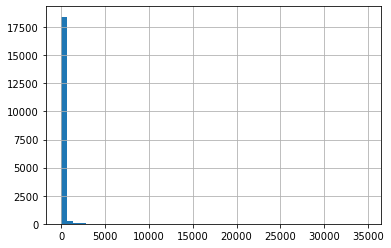

In [94]:
import matplotlib.pyplot as plt

plt.hist(seq_news_len, bins=50)
plt.grid()
plt.show()

### [2-2] 가변길이 데이터 => 고정 길이 데이터
---

In [95]:
# [3] 가변길이 => 고정길이 PADDING
from tensorflow.keras.utils import pad_sequences, to_categorical

In [96]:
len(seq_news)

18846

In [97]:
timestep_size=100
seq_pad_news=pad_sequences(seq_news, timestep_size)

In [98]:
seq_pad_news.shape

(18846, 100)

In [99]:
seq_pad_news[0]

array([    0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,     0,     0,     0,     0,     0,     0,     0,
           0,     0,   105, 16839,  2319,  1151,   311,  2930,  1074,
         263,  1165,   983,  2319,  2438,  2603,   155,   112, 15559,
         112, 16840,   128,    78,   151,   188,   207, 75588,  3662,
         112,  6794,  2319,   230,  1243,  2603,  1044,   233,  4975,
        1729,    45,    90,  1127,   524,  1826,    21,   158,  7949,
        1637,  1037,  1938,  6962,   192,  4975,   158,  1637,   234,
         439,   302,    67,  2319,    78,  1738, 28990,  3484,   407,
        7813,    40,  2787,  1629,   934,  1127,   524,   144,  2319,
        1033])

In [100]:
type(myToken.word_counts)

collections.OrderedDict

In [101]:
myToken.word_counts.values()

odict_values([2572, 15, 204, 415, 1193, 159, 444, 1395, 413, 478, 194, 183, 1992, 2456, 17, 15, 2252, 3067, 2021, 1733, 1626, 1, 122, 56, 1549, 397, 454, 1530, 84, 279, 4680, 2751, 423, 802, 262, 7000, 1964, 45, 295, 457, 245, 54, 1708, 1530, 900, 1219, 3385, 278, 6, 129, 968, 46, 4916, 169, 297, 506, 2061, 458, 223, 529, 1785, 674, 935, 1583, 412, 172, 1283, 796, 18847, 66, 621, 3939, 391, 552, 175, 112, 451, 57, 1, 24, 188, 1447, 142, 171, 3101, 1783, 1260, 488, 189, 290, 46, 55, 54, 104, 3, 42, 13316, 335, 405, 14231, 80, 142, 806, 197, 17, 6413, 641, 1043, 548, 3798, 141, 5153, 993, 2738, 8992, 179, 779, 1510, 97, 224, 261, 128, 904, 1119, 295, 13, 1206, 2218, 2839, 2883, 29, 97, 2, 2, 178, 1, 540, 158, 995, 3142, 310, 505, 50, 5431, 1732, 301, 3, 8770, 804, 1233, 14, 216, 7813, 1373, 112, 39, 19, 1698, 625, 2043, 4193, 607, 144, 720, 1409, 51, 839, 49, 1, 3429, 1842, 155, 75, 9, 3, 158, 300, 323, 1, 86, 119, 392, 733, 6304, 630, 16, 18, 640, 229, 834, 11, 3, 140, 219, 110, 286, 20

## [3] Model
---